In [1]:
import numpy as np 
# %%
import os
# import keypoint_moseq as kpms
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
%matplotlib widget
import ssm
import copy
from tqdm import tqdm
import glob
import pickle 
import matplotlib.gridspec as gridspec
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, leaves_list, dendrogram, fcluster
import seaborn as sns
import ipywidgets as widgets
from IPython.display import display
from ssm.util import random_rotation, find_permutation
from ipywidgets import interact, IntSlider
import sys
import glob
sys.path.append("/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/")
sys.path.append('/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/')
from collections import defaultdict
import random 
from scipy.ndimage import gaussian_filter1d
from get_data.read_neuro_beh_data import get_exp_features, load_json
from get_data.process_neural_data import get_derivative_of_neural_activity, get_neural_activity_from_labels, get_neural_activity_and_labels
from beh_classification.behavior_features import get_behavior_features
from get_data.read_neuro_beh_data import get_exp_features, load_json
import sys 
sys.path.append('/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/')
from beh_classification.process_midlines.midline_utils import save_as_csv, load_from_csv, convert_coordinates_to_angles

from rslds_motor_state_class_fncs import get_motor_state_start_end_is_rslds_start_end_specific



# import pickle 
# comp = "mac"
# if comp == "hpc":
#   project_dir = "/ru-auth/local/home/fbuck/scratch/WholeBrainImaging/keypt_moseq/projects/_1/"#sys.argv[1]+"_1"#/Volumes/FB1/moseq_project_dir/WholeBrainImagingAnalysis_1/"
#   video_dir = "/ru-auth/local/home/fbuck/scratch/WholeBrainImaging/outputs_hpc/" #"/Users/friederikebuck/Desktop/MBL/project/outputs/"  #when al subdirs with vids or keypoints are stored 
#   video_clip_dir = "/ru-auth/local/home/fbuck/scratch/WholeBrainImaging/outputs_hpc/vid_clips/"

# else: 
# #   project_dir = "/Volumes/FB1/moseq_project_dir_and_outputs/_1/"
# # moseq_project_dir = ""
#     project_dir = "/Volumes/FB1/moseq_project_dir_and_outputs/_1/"
#     project_dir = "/Volumes/FB_data_ana/moseq_project_dir_and_outputs/_1/"
#     video_dir = "/Users/friederikebuck/Desktop/MBL/project/outputs/" #"/Users/friederikebuck/Desktop/MBL/project/outputs/"  #when al subdirs with vids or keypoints are stored 
#     video_clip_dir = "/Users/friederikebuck/Desktop/MBL/project/vid_clips/"
#     save_dir = f"/Volumes/FB_data_ana/moseq_project_dir_and_outputs_figs/"

    # os.makedirs(save_dir, exist_ok=True)


# with open('/Users/friederikebuck/Desktop/MBL/project/keypt_moseq_coordinates_not_downsampled.pickle', 'rb') as handle:
#    coordinates =  pickle.load(handle)
   
   
# kappas = np.logspace(3,7,5)
# kappas = [kappas[0]]
# decrease_kappa_factor = 10
# num_ar_iters = 50
# num_full_iters = 200
# time_bin = 10
# prefix = 'my_kappa_scan'
# # for kappa in kappas: #kappas[:2]
# kappa = kappas[0]
# print(f"Fitting model with kappa={kappa}")
# model_name = f'{prefix}-{kappa}'
# fig_save_dir = os.path.join(save_dir, model_name)


In [2]:
from scipy.interpolate import interp1d
import numpy as np
from scipy.interpolate import interp1d
from PIL import Image
import os
from PIL import Image, ImageDraw, ImageFont
import matplotlib.colors as colors
import cv2
import copy
from functools import partial
import sys

def interpolate_feature_time_series(
                                    feature_time_series, 
                                    original_time, new_time,
                                    ):
    f_interp_imgs = interp1d(original_time, feature_time_series, axis=0, kind='linear', fill_value="extrapolate")
    # Get the interpolated values for the new frames
    feature_time_series_interpol = f_interp_imgs(new_time)
    return feature_time_series_interpol

def evenly_sample_feature(feature_timeseries, 
                          nir_to_confocal,
                          time_bins=10, ):

    indices = nir_to_confocal#.astype('int32')[1:]

    # Initialize frame counter for saving files
    frame_counter = 0
    feature_resampled = []
    # Loop through each unique index value
    for idx in np.unique(indices):
        if idx == 0: 
            continue
        frames = np.argwhere(indices == idx).flatten()

        # Define the original time points (0 to len(current_features)-1)
        original_time = np.arange(frames.shape[0])  # shape: (n_frames,)

        # Define the new time points (interpolated)
        new_time = np.linspace(0, frames.shape[0]- 1, time_bins) 
        
        interpolated_feature = interpolate_feature_time_series(
                            feature_timeseries[frames], 
                            original_time, new_time,
                            )

        feature_resampled.append(interpolated_feature)#[None, :])
    feature_resampled = np.concatenate(feature_resampled, axis =0 )
    return feature_resampled

def resample_binary(values, original_fps=6, target_fps=1.6):
    values = np.array(values)
    indices = np.arange(len(values))
    new_indices = np.linspace(0, len(values) - 1, int(len(values) * (target_fps / original_fps)))
    
    # Linear interpolation
    interpolated_values = np.interp(new_indices, indices, values)

    
    return interpolated_values

def get_acceleration(signed_speed, time_interval, sigma = 2 ): # this works..
     # Standard deviation for Gaussian kernel
    denoised_data = gaussian_filter1d(signed_speed, sigma=sigma)

    # Step 2: Compute the derivative of the denoised data
    # derivative = np.diff(denoised_data )
    return denoised_data, (denoised_data[time_interval:]- denoised_data[:-time_interval])/time_interval



def get_body_angle_mag_from_midline(midlines):
    body_angle_mag_all = []
    body_angles = []
    for midline in midlines: 
        
        mean_subtracted_angles, mean_angle = convert_coordinates_to_angles(midline)
        
        body_angle_mags = np.linalg.norm(mean_subtracted_angles)#, axis = 1)
        body_angle_mag_all.append(body_angle_mags)
        body_angles.append(mean_subtracted_angles)
    
    return np.array(body_angle_mag_all), np.array(body_angles)
       
def convert_coordinates_to_angles(midline):

    diffs = midline[1:,:]-midline[0:-1,:]
    angles = np.arccos(diffs[:,1]/np.sqrt(np.sum(diffs**2,axis=1)))*np.sign(diffs[:,0])
    angles = np.unwrap(angles)
    mean_angle = np.mean(angles)
    mean_subtracted_angle = angles-np.mean(angles)
    return mean_subtracted_angle, mean_angle

       
       


In [3]:


def find_runs(x):
    """Find start indices, end indices, and values of runs in a 1D array."""
    n = len(x)
    if n == 0:
        return np.array([], dtype=int), np.array([], dtype=int), np.array([], dtype=x.dtype)

    change_idx = np.diff(x, prepend=x[0]-1).nonzero()[0]
    start_idx = change_idx
    end_idx = np.append(change_idx[1:], n)
    values = x[start_idx]
    return start_idx, end_idx, values


def make_masks(labels):
    labels = np.asarray(labels)
    start_idx, end_idx, values = find_runs(labels)

    mask_1_to_2 = np.zeros_like(labels, dtype=int)
    mask_1_to_0 = np.zeros_like(labels, dtype=int)
    mask_2_after_1 = np.zeros_like(labels, dtype=int)
    mask_2_after_0 = np.zeros_like(labels, dtype=int)

    for i in range(len(values)):
        val = values[i]
        s, e = start_idx[i], end_idx[i]

        if val == 1:
            if i + 1 < len(values) and values[i + 1] == 2:
                mask_1_to_2[s:e] = 1
            elif i + 1 < len(values) and values[i + 1] == 0:
                mask_1_to_0[s:e] = 1

        elif val == 2:
            if i - 1 >= 0 and values[i - 1] == 1:
                mask_2_after_1[s:e] = 1
            elif i - 1 >= 0 and values[i - 1] == 0:
                mask_2_after_0[s:e] = 1
                
    # ev_of_rev_turn_bin, pure_rev_bin, turn_of_rev_turn_bin, pure_turn_bin = make_masks(z[i])

    return mask_1_to_2, mask_1_to_0, mask_2_after_1, mask_2_after_0




exp_dates ['2022-06-14-01', '2023-01-23-08', '2022-06-28-07', '2022-07-15-12', '2023-01-19-01', '2022-08-02-01', '2022-06-14-07', '2022-06-28-01', '2023-01-23-15', '2022-07-26-01', '2023-01-19-15', '2023-03-07-01', '2022-06-14-13', '2023-01-23-21', '2023-01-19-22', '2023-01-23-01', '2023-01-17-01', '2022-07-20-01', '2023-01-09-28', '2023-01-19-08', '2022-07-15-06']
Worm 0, date: 2022-06-14-01
Worm 1, date: 2023-01-23-08
Worm 2, date: 2022-06-28-07
Worm 3, date: 2022-07-15-12
Worm 4, date: 2023-01-19-01
Worm 5, date: 2022-08-02-01
Worm 6, date: 2022-06-14-07
Worm 7, date: 2022-06-28-01
Worm 8, date: 2023-01-23-15
Worm 9, date: 2022-07-26-01
Worm 10, date: 2023-01-19-15
Worm 11, date: 2023-03-07-01
Worm 12, date: 2022-06-14-13
Worm 13, date: 2023-01-23-21
Worm 14, date: 2023-01-19-22
Worm 15, date: 2023-01-23-01
Worm 16, date: 2023-01-17-01
Worm 17, date: 2022-07-20-01
Worm 18, date: 2023-01-09-28
Worm 19, date: 2023-01-19-08
Worm 20, date: 2022-07-15-06


/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/beh_classification/behavior_features.py:11: RuntimeWarning: Mean of empty slice
  body_angles = body_angles-np.nanmean(body_angles, axis = 1)[:, None]
/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/beh_classification/behavior_features.py:15: RuntimeWarning: Mean of empty slice
  centroids = np.nanmean(midlines, axis = 1)


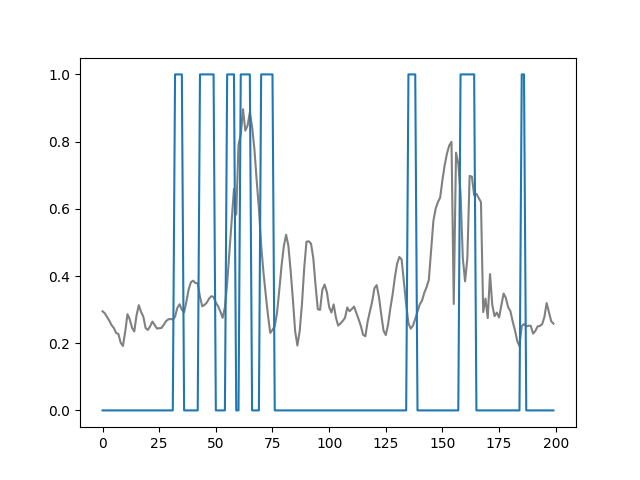

In [ ]:
####figure out how bennet sampled everything.. 
import numpy as np
from scipy.ndimage import gaussian_filter1d
import copy

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors



exp_date_to_midlines = {}
exp_date_to_body_angles = {}
exp_date_to_rslds_states = {}
exp_date_to_speed = {}
exp_date_to_velocity = {}
exp_date_to_head_angle  = {}
exp_date_to_acceleration  = {}
exp_date_to_worm_curvature = {}
exp_date_to_head_curvature = {}
exp_date_to_worm_vel = {}
exp_date_to_masks = {}
exp_date_to_beh ={}
exp_date_to_body_angle_mag = {}
exp_date_to_reor_type = {}
# exp_date_to_midlines = {}
target_length = 110
time_bin = 1

json_dir = "/Users/friederikebuck/Desktop/MBL/project/data/Neuropal_no_heat/"
h5_dir ="/Users/friederikebuck/Desktop/MBL/project/data/processed_h5/"
beh_data_dir_parent = "/Users/friederikebuck/Desktop/MBL/project/outputs/"
        
        
# with open(f'/Users/friederikebuck/Desktop/MBL/project/beh_syllables_rslds_{model_name}_all_exps.pickle', 'rb') as handle: ##off by 10..figureo ut in which directio n
#     a = pickle.load(handle)

#     exp_dates, exp_date_to_syllables, date_to_discrete_rslds_states, exp_date_to_beh,syllables, \
#     syllables_all_dates, rslds_states_all_dates, syllables_all_dates_flat, \
#     rslds_states_all_dates_flat, beh_all_dates_flat, beh_all_dates = a
    

directories = glob.glob(json_dir+"*.json") #get filename/paths of all the json files
exp_dates = [directory.split("/")[-1].split(".")[0] for directory in directories] #extract the exp_dates
print("exp_dates", exp_dates)
# for e in exp_dates: 
#     print(exp_date_to_beh[e].shape)

def load_from_csv(filename, n_frames = None, n_pts = None, n_dim = 2):
    # Load the CSV file
    reshaped_array = np.loadtxt(filename, delimiter=",")
    if n_frames is None: 
        n_frames = reshaped_array.shape[0]
    if n_pts is None: 
        n_pts = int(reshaped_array.shape[1]/2)
    # Reshape back to the original shape (n_frames, n_pts, 2)
    original_shape_array = reshaped_array.reshape(n_frames, n_pts, n_dim)
    
    return original_shape_array


from load_data_fncs import load_all_data, get_exp_dates
import sys
sys.path.append("/Users/friederikebuck/Downloads/worm notes/worm_code/")
T = 1599
_, _, full_beh_classification, full_beh_data = load_all_data()
z = [beh_classification["is_fwd"][0:1599]+ 2*beh_classification["is_rev"][0:1599]+ 4*beh_classification["is_pause"][0:1599]+3*beh_classification["is_turn"][0:1599]-1 for beh_classification in full_beh_classification]

motor_state_num_to_name = {
    0:"fwd", 
    1:"rev", 
    2:"turn", 
    3:"pure rev", 
    4:"rev of rev turn", 
    5:"turn of rev turn", 
    6:"pure turn"
}
rslds_state_num_to_name = {
    0:"fwd-like", 
    1:"rev-like", 
    2:"turn-like", 
    3:"pure rev", 
    4:"rev of rev turn", 
    5:"turn of rev turn", 
    6:"pure turn"
}



for i, exp_date in enumerate(exp_dates): 
    n_frames = z[i].shape[0]# exp_date_to_beh[exp_date].shape[0]
    # n_frames = -1
        
        
    midline_dir  = f"/Users/friederikebuck/Desktop/MBL/project/outputs/{exp_date}/csvs1"
    # midline_txt = os.path.join(midline_dir,f"midlines_resampled_target_length_110_timebin_{time_bin}.csv" )
    midline_txt = os.path.join(midline_dir,f"cropped_midlines_wormtracer_target_length_{target_length}_timebin_{time_bin}.csv" )
    midlines = load_from_csv(midline_txt)[:n_frames, :, :]
    ###need to resamplet o confocal timeframe 
    masks_txt = os.path.join(midline_dir,f"mask_resampled_target_length_{target_length}_timebin_{time_bin}.csv" )
    masks = np.loadtxt(masks_txt, delimiter=",")[:n_frames]
    
    exp_date_to_midlines[exp_date] = midlines
    exp_date_to_masks[exp_date] = masks
    exp_date_to_body_angle_mag[exp_date] = get_body_angle_mag_from_midline(midlines)[0]
    # exp_date_to_rslds_states[exp_date] = rslds_states_all_dates[:,  i ]
    
    speed_txt = os.path.join(midline_dir,f"nir_speed_stage_resampled_timebin_{time_bin}.csv" )
    # speed_resampled = load_from_csv(speed_txt)[:n_frames]#, :, :]
    speed_resampled =np.loadtxt(speed_txt, delimiter=",")[:n_frames]
    exp_date_to_speed[exp_date] = speed_resampled
    
    velocity_txt = os.path.join(midline_dir,f"nir_velocity_stage_resampled_timebin_{time_bin}.csv" )
    # speed_resampled = load_from_csv(speed_txt)[:n_frames]#, :, :]
    velocity_resampled = np.loadtxt(velocity_txt, delimiter=",")[:n_frames]
    # velocity_resampled = 
    exp_date_to_velocity[exp_date] = velocity_resampled
    
    acceleration = np.zeros(n_frames)
    acceleration[:9] = np.nan
    # print(acceleration[9:].shape)
    # print(np.loadtxt(velocity_txt, delimiter=",")[:n_frames+10].shape)
    # print(get_acceleration(np.loadtxt(velocity_txt, delimiter=",")[:n_frames+1], 10, sigma = 2 )[1].shape)
    acceleration[9:] = get_acceleration(np.loadtxt(velocity_txt, delimiter=",")[:n_frames+1], 10, sigma = 2 )[1] #get_acceleration(np.loadtxt(velocity_txt, delimiter=",")[:n_frames+10], 10, sigma = 2 )[1]
    exp_date_to_acceleration[exp_date] = acceleration
    



    exp_date_to_velocity[exp_date] = velocity_resampled
    
    head_angle_txt = os.path.join(midline_dir,f"nir_head_angle_resampled_timebin_{time_bin}.csv" )
    # head_angle_resampled = load_from_csv(head_angle_txt)[:n_frames]#, :, :]
    head_angle_resampled =np.loadtxt(head_angle_txt, delimiter=",")[:n_frames]
    exp_date_to_head_angle[exp_date] = head_angle_resampled
    
    dt, T, beh_data, neural_data, neuroID_to_key = get_exp_features(exp_date, 
                                                                json_dir = json_dir, 
                                                                h5_dir = h5_dir)
    behavior_features = get_behavior_features(beh_data)
    beh_data.update(behavior_features)
    exp_date_to_worm_curvature[exp_date] = beh_data["worm_curvature"]
    exp_date_to_head_curvature[exp_date] = beh_data["head_angle"]
    exp_date_to_worm_vel[exp_date] = beh_data["worm_curvature"]
    rev_of_rev_turn_bin, pure_rev_bin, turn_of_rev_turn_bin, pure_turn_bin = make_masks(z[i])
    reor_types = np.zeros(1599)
    reor_types[pure_rev_bin.astype('bool')] = 3
    reor_types[rev_of_rev_turn_bin.astype('bool')] = 4
    reor_types[turn_of_rev_turn_bin.astype('bool')] = 5
    reor_types[pure_turn_bin.astype('bool')] = 6
    
    exp_date_to_reor_type[exp_date] = reor_types
    # print(np.unique(reor_types))
    # print(np.unique(z[i]))
    exp_date_to_beh[exp_date] = z[i]
    # velocity = np.array([full_beh_data[i]["velocity"][0:1599] for i in range(len(full_beh_data))])
    # acceleration = np.array([full_beh_data[i]["acceleration"][1:1600] for i in range(len(full_beh_data))])
    # head_curvature = np.array([full_beh_data[i]["head_angle"][0:1599] for i in range(len(full_beh_data))])
    # worm_curvature = np.array([full_beh_data[i]["worm_curvature"][0:1599] for i in range(len(full_beh_data))])
    # pumping = np.array([full_beh_data[i]["pumping"][0:1599] for i in range(len(full_beh_data))])
exp_date = exp_dates[-4]
# for exp_date in exp_dates:
fig, ax = plt.subplots()
time = np.arange(200,400)
ax.plot((exp_date_to_worm_curvature[exp_date]/np.nanmax(exp_date_to_worm_curvature[exp_date]))[time], c = "gray")
ax.plot((exp_date_to_masks[exp_date]/np.nanmax(exp_date_to_masks[exp_date]))[time])
    # ax.plot(velocity_resampled[300:600])
    # ax.plot(np.abs(velocity_resampled[300:600]))
    # ax2.plot( exp_date_to_acceleration[exp_date][300:600])

(1599, 49)


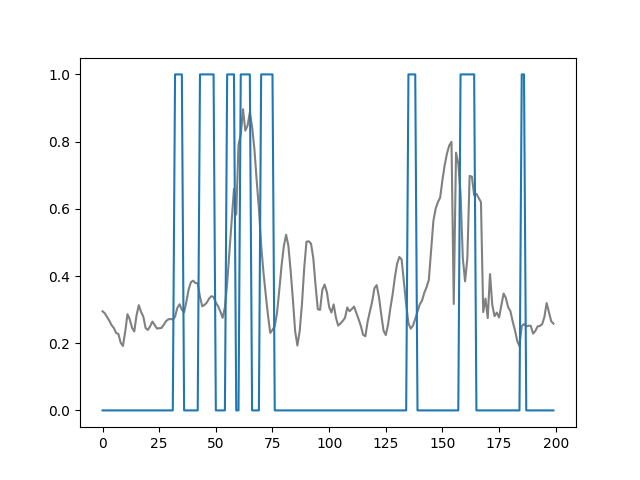

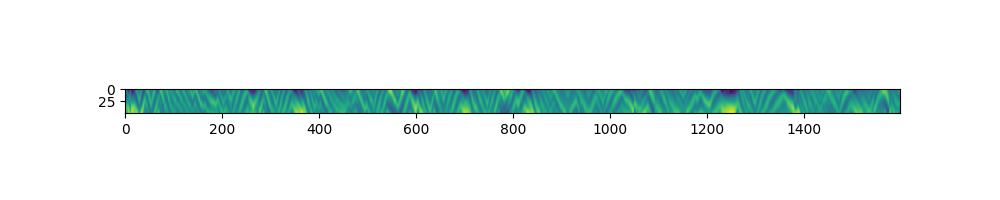

In [5]:

exp_date = exp_dates[-4]
# for exp_date in exp_dates:
fig, ax = plt.subplots()
time = np.arange(200,400)
ax.plot((exp_date_to_worm_curvature[exp_date]/np.nanmax(exp_date_to_worm_curvature[exp_date]))[time], c = "gray")
ax.plot((exp_date_to_masks[exp_date]/np.nanmax(exp_date_to_masks[exp_date]))[time])
# ax.plot((exp_date_to_body_angle_mag[exp_date]/np.nanmax(exp_date_to_body_angle_mag[exp_date]))[time])
_, body_angles = get_body_angle_mag_from_midline(exp_date_to_midlines[exp_date])

fig, ax = plt.subplots(figsize = (10,2))
print(body_angles.shape)
# plt.scatter(*exp_date_to_midlines[exp_date][0].T)
plt.imshow(body_angles.T)
# exp_date_to_midlines
    # ax.plot(velocity_resampled[300:600])
    # ax.plot(np.abs(velocity_resampled[300:600]))
    # ax2.plot( exp_date_to_acceleration[exp_date][300:600])

In [6]:
from scipy.stats import ks_2samp

def plot_probabilities_hist(np_array, bins, color = "blue", 
                            alpha = 0.7, label ="",
                             fig = None, ax = None, 
                             text ="", x_ratio = 9/12, y_ratio = 10/12, ylim = None, fill = True, 
                             linewidth=2):#fromstackoverflowhttps://stackoverflow.com/questions/3866520/plot-a-histogram-such-that-bar-heights-sum-to-1-probability
    if fig is None: 
        fig, ax = plt.subplots()
    weights = np.ones_like(np_array)/len(np_array)
    if not fill: 
       
        
        ax.hist(np_array, bins = bins, weights= weights, color = color, alpha = alpha, histtype='step',  label = label, fill = fill, linewidth = 2)
    else: 
         ax.hist(np_array, bins = bins, weights= weights, color = color, alpha = alpha, label = label)
    # if len(text)>0:
    #     add_text_to_upper_right_corner(ax, text,  x_ratio = x_ratio, y_ratio = y_ratio)
    # if ylim is None: 
    #     ax.set_ylim([0,1.1])
    return fig, ax


def plot_hist_across_conditins_and_get_KS_stats(cond_to_data,  conditon_to_color,
                                               title = "", 
                                               ylabel = "",
                                               xlabel = "",
                                               stat_color = "dark" ,
                                               bins = None, 
                                            #    ylim = [0,1.1],
                                            ylim = None, 
                                               alpha = 0.7, 
                                            #    linewidth=2, 
                                            fill =  False,
                                               fig = None, 
                                               ax = None , 
                                               print_sig = True,
                                               print_effect_size = False, 
                                               legend = False, condition_to_alpha = None, 
                                               plot_medians = False, 
                                               print_median_diff = False
                                
                                               ):
    
    
        
    if ax is None: 
        fig, ax = plt.subplots()
    medians = []
    for condition, data  in cond_to_data.items():
            
        counts, bin_edges = np.histogram(data, bins=bins, weights=np.ones_like(data)/len(data), density=False)
        cdf = np.cumsum(counts)
        
        # Normalize the CDF to ensure it ends at 1
        cdf = cdf / cdf[-1]

        if condition_to_alpha is None: 
            
            plot_probabilities_hist(data,  
                    bins,
                    conditon_to_color[condition], 
                    alpha = alpha, 
                    label = condition,
            
                    fig = fig, ax = ax, 
                    fill = fill, 
                    # text ="",
                    )
            
                
        else: 
            plot_probabilities_hist(data,  
                    bins,
                    conditon_to_color[condition], 
                    alpha = condition_to_alpha[condition], 
                    label = condition,
            
                    fig = fig, ax = ax, 
                    fill = fill, 
                    # text ="", 
                    )
        if plot_medians: 
            median = np.median(data)
            medians.append(median)
        
            ax.axvline(median, linestyle = "--", color = conditon_to_color[condition], alpha = alpha)
    if legend: 
        ax.legend()
    if ylim is not None: 
        ax.set_ylim(ylim)
    ax.set_title(title,  fontsize=19)
    ax.set_ylabel(ylabel, fontsize=19)
    ax.set_xlabel(xlabel, fontsize=19)


    ax.tick_params(axis='x', labelsize=14)  
    ax.tick_params(axis='y', labelsize=14)  
    
    # ax.spines['top'].set_visible(False)   # Hide top spine
    # ax.spines['right'].set_visible(False)  # Hide right spine

    # ax.spines['left'].set_linewidth(2)   # Left spine bold
    # ax.spines['bottom'].set_linewidth(2)  # Bottom spine bold
    # fig.set_size_inches(4, 5)

    # Compute KS Test if reference_data is provided
    ks_stat, p_value = None, None
    conditions = list(cond_to_data.keys())

    ks_stat, p_value = ks_2samp(cond_to_data[conditions[0]], cond_to_data[conditions[1]])  # 2-sample KS test
    
    # Determine significance stars
    if p_value < 0.001:
        stars = "***"
    elif p_value < 0.01:
        stars = "**"
    elif p_value < 0.05:
        stars = "*"
        
    else:
        stars = "ns"  # Not significant
    if print_effect_size and stars!= "ns": 
        stars = stars+ " " + str(np.round(ks_stat,2))
    if print_median_diff and len(medians)==2: 
        stars = stars+ " " + str(np.abs(np.round(np.diff(np.array(medians)),2))[0])
        ax.text(0.95, 0.95, stars, transform=ax.transAxes, fontsize=25, color=stat_color, ha='right', va='top' , fontweight='bold')
    
    if print_sig: 
    # Add stars to the plot in the lower-right corner
        ax.text(0.95, 0.95, stars, transform=ax.transAxes, fontsize=25, color=stat_color, ha='right', va='top' , fontweight='bold')

    
    # Optionally print results
    # print(f"KS Statistic: {ks_stat}, p-value: {p_value}")
    fig.tight_layout()
    return fig, ax 
# feature_fnc = lambda x: np.mean(x)
feature_fnc = lambda x: np.max(x)
######
n_rslds_states = 2
rslds_pairs = [(x,y) for x in range(n_rslds_states+1) for y in range(n_rslds_states+1)]


(21, 1599, 138)
138
(1599, 49)


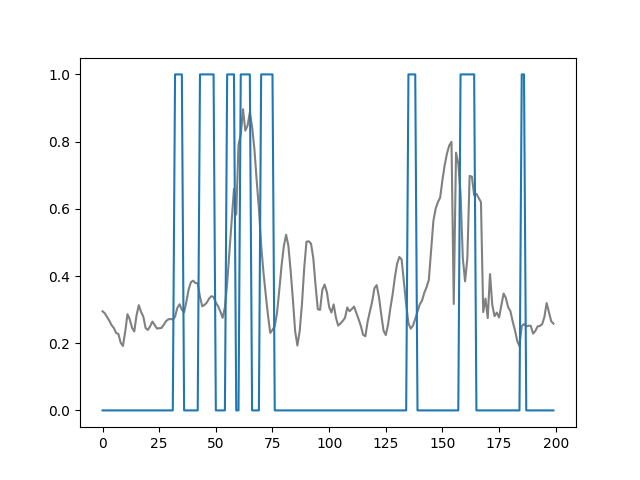

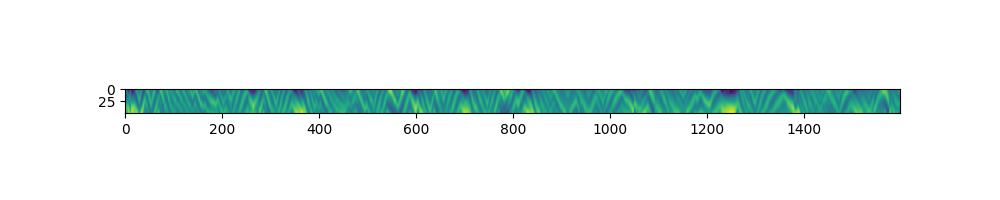

In [7]:
np.random.seed(0)

foldername = "/Users/friederikebuck/Downloads/worm notes/processed_checkpts/test_rslds_QM_run_061325/model_selection/top_2_combined/"
items = np.array(os.listdir(foldername))
folders = np.array(["." not in directory for directory in items], dtype=bool)
folders = items[folders]

folder = folders[0]


with open(foldername+"/Y.npy", 'rb') as handle:  
    Y = pickle.load(handle)


with open(foldername+folder+"/saved_data/prior.npy", 'rb') as handle:
    global_worm = pickle.load(handle)
    global_worm.D = int(global_worm.D)

with open(foldername+folder+"/saved_data/prior_q.npy", 'rb') as handle:
    q = pickle.load(handle)
    

slds = global_worm

neural_labels = np.load(foldername+"/neurons.npy", allow_pickle=True)


print(np.array(Y).shape)

print(len(neural_labels))



slds = global_worm
# get estimated latents, states
q_x = q.mean_continuous_states
q_z = [slds.most_likely_states(q_x[w], Y[w]) for w in range(len(q_x))]

z = [beh_classification["is_fwd"][0:1599]+ 2*beh_classification["is_rev"][0:1599]+ 4*beh_classification["is_pause"][0:1599]+3*beh_classification["is_turn"][0:1599]-1 for beh_classification in full_beh_classification]




exp_date = exp_dates[-4]
# for exp_date in exp_dates:
fig, ax = plt.subplots()
time = np.arange(200,400)
ax.plot((exp_date_to_worm_curvature[exp_date]/np.nanmax(exp_date_to_worm_curvature[exp_date]))[time], c = "gray")
ax.plot((exp_date_to_masks[exp_date]/np.nanmax(exp_date_to_masks[exp_date]))[time])
_, body_angles = get_body_angle_mag_from_midline(exp_date_to_midlines[exp_date])
fig, ax = plt.subplots(figsize = (10,2))
print(body_angles.shape)
# plt.scatter(*exp_date_to_midlines[exp_date][0].T)
plt.imshow(body_angles.T)
date_i = np.argwhere(np.array(exp_dates) == exp_date).flatten()
state = z[date_i[0]]

In [8]:
# print(len(neural_labels))

In [ ]:


def get_zero_crossing_indices(arr):
    arr = np.asarray(arr)
    signs = np.sign(arr)
    # Replace zeros with previous nonzero sign to avoid false crossings
    for i in range(1, len(signs)):
        if signs[i] == 0:
            signs[i] = signs[i-1]

    crossings = np.where(np.diff(signs) != 0)[0]
    return crossings  # indices *before* crossing


def count_zero_crossing(body_angle, starts, ends):
    total_crossings = []
    crossings_is = []
    if len(starts)==0:
        return [], np.array([])
    for start, end in zip(starts, ends):
        crossings_i = get_zero_crossing_indices(body_angle[start:end])
        crossings_is.append(crossings_i+start)
        total_crossings.append(len(crossings_i))
        
    # print(total_crossings,crossings_is )
    return total_crossings, np.concatenate(crossings_is)




feature_to_dict = {
    "n body swings":
        {
        "exp_date_to_feature":  {date: get_body_angle_mag_from_midline(midline)[1][:, 20] for date,midline in exp_date_to_midlines.items() },
        "bins": np.arange(0, 15, 1), 
         "feature_fnc": lambda body_angle_over_event: len(get_zero_crossing_indices(body_angle_over_event)), 
         "ylim": [0, 0.5],
          "ylabel": "P(n body swings)", 
          "feature_mat": np.concatenate([get_body_angle_mag_from_midline(midline)[1][:, 20][:, None] for date, midline in exp_date_to_midlines.items()], axis = 1), 
        
    },
        
    "duration (s)": {
        "exp_date_to_feature": "", 
        "bins": np.linspace(0, 45, 25), 
         "feature_fnc": lambda x: np.nanmax(x), 
         "ylim": [0, 0.5],
          "ylabel": "P(duration)", 
          "feature_mat": "", 
        
    },
        
    "curviness (radians)":
        {"exp_date_to_feature": exp_date_to_body_angle_mag, 
         "bins": np.linspace(0,16, 25), 
         "feature_fnc": lambda x: np.nanmax(x), 
         "ylim": [0, 0.2], 
          "ylabel": "P(curviness)", 
          "feature_mat": np.concatenate([exp_date_to_body_angle_mag[date][:, None] for date in exp_dates], axis = 1)
        } , 
    # "velocity (mm/s)": (exp_date_to_velocity,   np.linspace(0,0.35, 50),  lambda x: np.max(np.abs(x))), 
    "speed (um/s)": 
        {"exp_date_to_feature": exp_date_to_velocity, 
         "bins":  np.linspace(0,350, 25), 
         "feature_fnc": lambda x:np.nanmax(np.abs(x)), 
         "ylim": [0, 0.24], 
         "ylabel": "P(max speed)", 
         "feature_mat": np.concatenate([exp_date_to_velocity[date][:, None] for date in exp_dates], axis = 1)
        } , 
    # # "head angle": (exp_date_to_head_angle,  50,  lambda x: np.mean(x)),#np.arange(0, 6, 0.01)), , 
    "acceleration (um/s^2)": 
        {"exp_date_to_feature": exp_date_to_acceleration, 
         "bins":  np.linspace(0,0.015, 25),
         "feature_fnc":  lambda x: np.nanmax(np.abs(x)), 
         "ylim": [0, 0.14] ,
          "ylabel": "P(max acceleration)", 
          "feature_mat": np.concatenate([exp_date_to_acceleration[date][:, None] for date in exp_dates], axis = 1)
        } , 
    
}


rslds_state_to_label = {
    0: "fwds - dominated", 
    1: "rev - dominated",
    2: "turn - dominated"
}


rslds_state_to_color = {
    0: "salmon", 
    1: "dodgerblue", 
    2: "green"
}




In [10]:
# exp_date_to_body_angle_mag['2022-06-28-07']

135
696
113
944
944


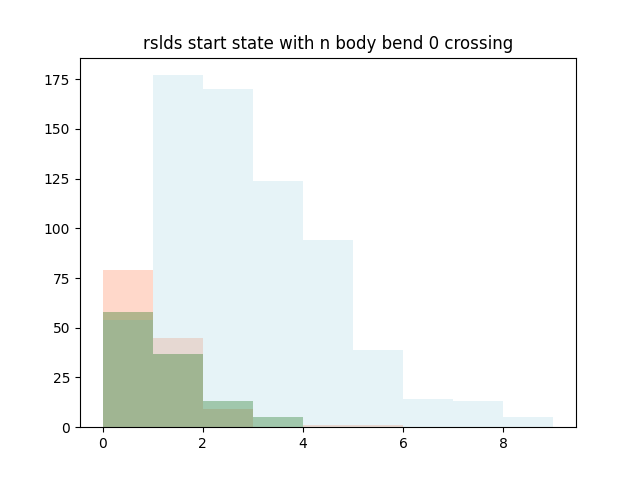

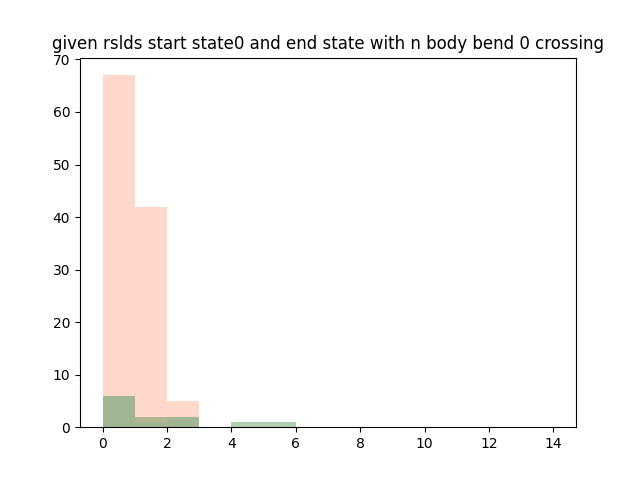

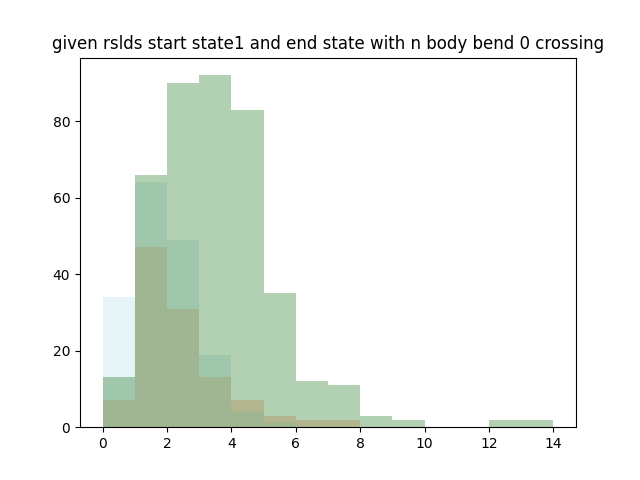

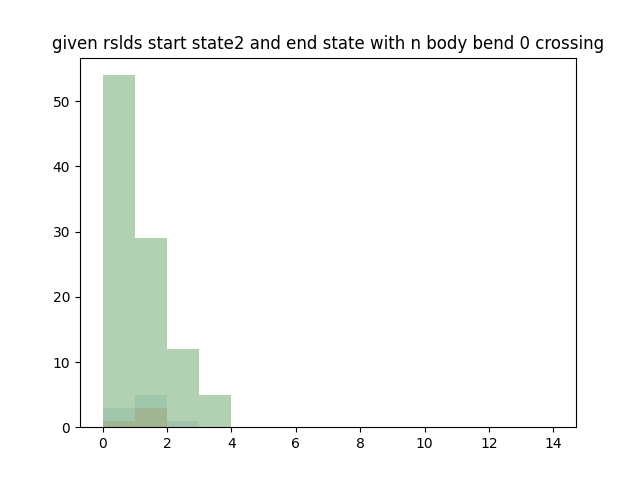

In [11]:
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import numpy as np

def plot_states_and_neurons(state,
                            # traces, labels, 
                            body_angle, 
                         fig = None, axs = None, palette = None, cmap = None):
    
    if cmap is None:

        #color palette for plotting, colors as in make_behavior_ethogram
        palette = ["coral",     # forward
                "lightblue", # reverse
                "darkgreen", # turn
                "purple","red", "yellow", "black", "pink"]    # pause
        cmap = LinearSegmentedColormap.from_list("behavior", palette, N=len(palette))
    fig, axs = plt.subplots(2,1,sharex = True, figsize=(18, 6))
    ax = axs[0]
    ax_img = ax.twinx()        
    ax_img.imshow(state[None,:], aspect="auto", cmap=cmap, alpha=0.3, 
                    vmin=0, vmax=len(palette)
                    , extent=[0, len(state), 0, 1]
                    )
    

    ax_img.set_yticks([])
    ax_img.set_ylim(0, 1)  # Keep the background thin and constant

    # Hide twin axis spines
    for spine in ax_img.spines.values():
        spine.set_visible(False)

    ax.set_yticks([])
    # if i == 0:
    #     ax.set_title(f"{date}; Beh")
    # else:
    #     ax.set_title("Inferred by rSLDS")
    #     ax.set_xticks([])
    head_i = 3
    ax.plot(np.arange(body_angle[:, head_i].shape[0]), body_angle[:, head_i], c ="red", label = "head")
    body_i = 20
    ax.plot(np.arange(body_angle[:, body_i].shape[0]), body_angle[:, body_i], c ="orange", label = "body")
    axs[0].legend(loc="upper left")
    ax.axhline(0)
    
    
    axs[1].imshow(body_angle.T)
    return fig, axs, ax_img 


def plot_states_and_neurons_1(beh_state, rslds_state,
                            # traces, labels, 
                            body_angle, 
                         fig = None, axs = None, palette = None, cmap = None):
    
    if cmap is None:

        #color palette for plotting, colors as in make_behavior_ethogram
        palette = ["coral",     # forward
                "lightblue", # reverse
                "darkgreen", # turn
                "purple","red", "yellow", "black", "pink"]    # pause
        cmap = LinearSegmentedColormap.from_list("behavior", palette, N=len(palette))
    fig, axs = plt.subplots(2,1,sharex = True, figsize=(18, 6))
    ax = axs[0]
    ax_img = ax.twinx()        
    ax_img.imshow(beh_state[None,:], aspect="auto", cmap=cmap, alpha=0.3, 
                    vmin=0, vmax=len(palette)
                    , extent=[0, len(beh_state), 0, 1]
                    )
    

    ax_img.set_yticks([])
    ax_img.set_ylim(0, 1)  # Keep the background thin and constant

    # Hide twin axis spines
    for spine in ax_img.spines.values():
        spine.set_visible(False)

    ax.set_yticks([])
    # if i == 0:
    #     ax.set_title(f"{date}; Beh")
    # else:
    #     ax.set_title("Inferred by rSLDS")
    #     ax.set_xticks([])
    head_i = 3
    ax.plot(np.arange(body_angle[:, head_i].shape[0]), body_angle[:, head_i], c ="red", label = "head")
    body_i = 20
    ax.plot(np.arange(body_angle[:, body_i].shape[0]), body_angle[:, body_i], c ="orange", label = "body")
    ax.legend(loc="upper left")
    ax.axhline(0)
    
    
    ax = axs[1]
    ax_img1 = ax.twinx()        
    ax_img1.imshow(rslds_state[None,:], aspect="auto", cmap=cmap, alpha=0.3, 
                    vmin=0, vmax=len(palette)
                    , extent=[0, len(rslds_state), 0, 1]
                    )
    

    ax_img1.set_yticks([])
    ax_img1.set_ylim(0, 1)  # Keep the background thin and constant

    # Hide twin axis spines
    for spine in ax_img1.spines.values():
        spine.set_visible(False)

    ax.set_yticks([])
    # if i == 0:
    #     ax.set_title(f"{date}; Beh")
    # else:
    #     ax.set_title("Inferred by rSLDS")
    #     ax.set_xticks([])
    head_i = 3
    ax.plot(np.arange(body_angle[:, head_i].shape[0]), body_angle[:, head_i], c ="red", label = "head")
    body_i = 20
    ax.plot(np.arange(body_angle[:, body_i].shape[0]), body_angle[:, body_i], c ="orange", label = "body")
    ax.legend(loc="upper left")
    ax.axhline(0)
    
    
    # axs[-1].imshow(body_angle.T)
    return fig, axs, ax_img , ax_img1




def get_transitions(stateseq):
    ''' copied from keypoint moseq github: keypoint-moseq/keypoint_moseq/util.py'''
    transitions = np.nonzero(stateseq[1:] != stateseq[:-1])[0] + 1
    starts = np.insert(transitions, 0, 0)
    ends = np.append(transitions, len(stateseq))
    return  transitions, starts, ends



    
def get_state_start_ends(state, stateseq,  starts= None, ends = None):
    if starts is None: 
        transitions, starts, ends = get_transitions(stateseq)
    # for state1, state2 in state_pairs:
    state_start_is = np.argwhere(state==stateseq[starts[:-1]]).flatten()
    
    state_starts = starts[state_start_is]
    state_ends = ends[state_start_is] ##check 
    
    return state_starts, state_ends
 


# exp_date = exp_dates[-4]
# time = np.arange(200,400)

# _, body_angles = get_body_angle_mag_from_midline(exp_date_to_midlines[exp_date])

# print(body_angles.shape)
# date_i = np.argwhere(np.array(exp_dates) == exp_date).flatten()
# state = z[date_i[0]]
# start, end = 0, 400
# plot_states_and_neurons(state[start:end],
#                             # traces, labels, 
#                             body_angles[ start:end,:],
#                             fig = None, axs = None, palette = None, cmap = None)

palette = ["coral",     # forward
        "lightblue", # reverse
        "darkgreen", # turn
        "purple","red", "yellow", "black", "pink"] 


slds = global_worm
beh_state_to_i = {
    "rev":1
}
beh_state = "rev"
rev_state = beh_state_to_i["rev"]

counts = np.zeros((n_rslds_states+1, n_rslds_states+1))

# rslds_pairs = permutations(list(range(n_rslds_states+1)))
# rslds_pairs = [(x,y) for x in range(n_rslds_states+1) for y in range(n_rslds_states+1)]
start = 0 
end = z[0].shape[0]


rslds_state_to_n_zero_crossings = {state:[] for state in [0,1,2]}
rslds_state_to_total_revs = {state:0 for state in [0,1,2]}
total_revs = 0 
for rslds_start_state in [0,1,2]:
    for i, (date, z_w, q_z_w) in enumerate(zip(exp_dates, z, q_z)):# (exp_date, behseq) in exp_date_to_beh.items():
    # for i, behseq in enumerate(z):
        # rsldsseq = z[i]
        # date_i = np.argwhere(np.array(exp_dates) == exp_date).flatten()
        
        _, body_angles = get_body_angle_mag_from_midline(exp_date_to_midlines[date])

        # rsldsseq = exp_date_to_rslds_states[exp_date]
        rev_starts, rev_ends = get_state_start_ends(rev_state, z_w[ start:end],  starts= None, ends = None)
    
        
        '''get where start in rslds state '''
        rev_is = np.argwhere(
            # np.logical_and(
            rslds_start_state==q_z_w[rev_starts]
                                #    , 
                                #    rslds_end_state==q_z_w[rev_ends-1]
                                   
                                #    )
                             ).flatten()
        total_revs+=rev_is.shape[0]
        starts, ends = rev_starts[rev_is], rev_ends[rev_is]
        body_i = 20
        rslds_state_to_total_revs[rslds_start_state]+=len(starts)
        total_crossings, crossings_is = count_zero_crossing(body_angles[ start:end, body_i], starts,  ends)

        # fig, axs, ax_img, ax_img1 = plot_states_and_neurons_1(z_w[start:end], q_z_w[start:end],
        #                     # traces, labels, 
        #                     body_angles[ start:end,:],
        #                  fig = None, axs = None, palette = None, cmap = None)
        # ax_img.set_title(f"rslds: {rslds_start_state}; date")
        
        # for rev_i in rev_is:
        #     ax_img.axvline(rev_starts[rev_i], color = "blue")
        # for cross_i in crossings_is:
        #     ax_img.axvline(cross_i, color = "purple")
        rslds_state_to_n_zero_crossings[rslds_start_state].extend(total_crossings)

        # break
        # counts[rslds_start_state, rslds_end_state]+=rev_is.shape[0]
fig, ax = plt.subplots()
total_events = 0
bins = np.arange(0, 10, 1)
for state, n_crossings in rslds_state_to_n_zero_crossings.items():
    ax.hist(n_crossings, color = palette[state], alpha = 0.3, bins = bins)
    total_events+=len(n_crossings)
    print(rslds_state_to_total_revs[state])
ax.set_title("rslds start state with n body bend 0 crossing")
print(total_events)
print(total_revs)


############################

from itertools import permutations
rslds_pairs = permutations(list(range(n_rslds_states+1)))
rslds_pairs = [(x,y) for x in range(n_rslds_states+1) for y in range(n_rslds_states+1)]
start = 0 
end = z[0].shape[0]


rslds_state_to_n_zero_crossings = {pair:[] for pair in rslds_pairs}
rslds_state_to_rev_duration = {pair:[] for pair in rslds_pairs}
rslds_state_to_rev_start_end_is = {pair:([],[]) for pair in rslds_pairs}
rslds_state_to_total_revs = {pair:0 for pair in rslds_pairs}
total_revs = 0 
for rslds_start_state, rslds_end_state in rslds_pairs: 
    for i, (date, z_w, q_z_w) in enumerate(zip(exp_dates, z, q_z)):# (exp_date, behseq) in exp_date_to_beh.items():
        _, body_angles = get_body_angle_mag_from_midline(exp_date_to_midlines[date])
        rev_starts, rev_ends = get_state_start_ends(rev_state, z_w[ start:end],  starts= None, ends = None)
        '''get where start in rslds state '''
        rev_is = np.argwhere(
            np.logical_and(
            rslds_start_state==q_z_w[rev_starts]
                                   , 
                                   rslds_end_state==q_z_w[rev_ends-1]
                                   
                                   )
                             ).flatten()
        total_revs+=rev_is.shape[0]
        starts, ends = rev_starts[rev_is], rev_ends[rev_is]
        body_i = 20
        rslds_state_to_total_revs[(rslds_start_state, rslds_end_state)]+=len(starts)
        rslds_state_to_rev_duration[(rslds_start_state, rslds_end_state)].extend((ends-starts).tolist())
        rslds_state_to_rev_start_end_is[(rslds_start_state, rslds_end_state)][0].extend(starts)
        rslds_state_to_rev_start_end_is[(rslds_start_state, rslds_end_state)][1].extend(ends)
        total_crossings, crossings_is = count_zero_crossing(body_angles[ start:end, body_i], starts,  ends)

        # fig, axs, ax_img, ax_img1 = plot_states_and_neurons_1(z_w[start:end], q_z_w[start:end],
        #                     # traces, labels, 
        #                     body_angles[ start:end,:],
        #                  fig = None, axs = None, palette = None, cmap = None)
        # ax_img.set_title(f"rslds: {rslds_start_state} {rslds_end_state}; date")
        
        # for rev_i in rev_is:
        #     ax_img.axvline(rev_starts[rev_i], color = "green")
        #     ax_img.axvline(rev_ends[rev_i], color = "red")
        # for cross_i in crossings_is:
        #     ax_img.axvline(cross_i, color = "purple")
        rslds_state_to_n_zero_crossings[(rslds_start_state, rslds_end_state)].extend(total_crossings)
        # break
        # break
        # counts[rslds_start_state, rslds_end_state]+=rev_is.shape[0]

for start_state in [0,1,2]:
    fig, ax = plt.subplots()
    total_events = 0
    bins = np.arange(0, 15, 1)
    for end_state in [0,1,2]:
        n_crossings = rslds_state_to_n_zero_crossings[(start_state, end_state)]
   
        ax.hist(n_crossings, color = palette[end_state], alpha = 0.3, bins = bins)
        total_events+=len(n_crossings)
        # print(rslds_state_to_total_revs[(start_state, end_state)])
    ax.set_title(f"given rslds start state{start_state} and end state with n body bend 0 crossing")
    # print(total_events)
    # print(total_revs)
    

# for start_state in [0,1,2]:
#     fig, ax = plt.subplots()
#     total_events = 0
#     bins = np.linspace(0, 60, 50)
#     for end_state in [0,1,2]:
#         n_crossings = rslds_state_to_rev_duration[(start_state, end_state)]
   
#         ax.hist(n_crossings, color = palette[end_state], alpha = 0.3, bins = bins)
#         total_events+=len(n_crossings)
#         # print(rslds_state_to_total_revs[(start_state, end_state)])
#     ax.set_title(f"given rslds start state{start_state} and end state duration")
#     # print(total_events)
#     # print(total_revs)

In [ ]:

###############################

def get_motor_state_start_end_is_rslds_start_end_specific(motor_states, rslds_states):
    track_to_date = dict(enumerate(exp_dates))
    state_to_track_start_end_is = {}
    state_to_lbl = {}
    rslds_pairs = [(x,y) for x in rslds_states for y in rslds_states]
    state = 0
    for motor_state in motor_states:#[0,1,2]:
        for rslds_start_state, rslds_end_state in rslds_pairs: 
            
            state_lbl = (motor_state,(rslds_start_state, rslds_end_state) )
            state_to_lbl[state] = state_lbl
            
            all_tracks = []
            all_starts = []
            all_ends = []
            for i, (date, z_w, q_z_w) in enumerate(zip(exp_dates, z, q_z)):# (exp_date, behseq) in exp_date_to_beh.items():
                beh_starts, beh_ends = get_state_start_ends(motor_state, z_w[ start:end],  starts= None, ends = None)
                
                '''get where start in rslds state '''
                rev_is = np.argwhere(
                    np.logical_and(
                    rslds_start_state==q_z_w[beh_starts]
                                        , 
                                        rslds_end_state==q_z_w[beh_ends-1]
                                        
                                        )
                                    ).flatten()
                # total_behs+=rev_is.shape[0]
                starts, ends = beh_starts[rev_is], beh_ends[rev_is]

                all_tracks.append(np.ones(starts.shape[0])*state)
                all_starts.append(starts)
                all_ends.append(ends)
            state_to_track_start_end_is[state] = np.concatenate([
                                                    np.concatenate(all_tracks)[:,None],
                                                    np.concatenate(all_starts)[:,None],
                                                    np.concatenate(all_ends)[:,None]
                                                ], axis = 1)
            state+=1
    return track_to_date,state_to_lbl,  state_to_track_start_end_is
        
        
            
            
        
 

def get_motor_state_start_end_is_rslds_start_end_specific(motor_state, exp_dates, z, q_z,  rslds_states = [0,1,2], start = None, end = None, plot = False):
    rslds_pairs = permutations(rslds_states)
    rslds_pairs = [(x,y) for x in rslds_states for y in rslds_states]
    if start is None: 
        start = 0 
        end = z[0].shape[0]
    rslds_state_to_exp_date_to_beh_start_end_is ={pair:{} for pair in rslds_pairs}# {pair:([],[]) for pair in rslds_pairs}
    for rslds_start_state, rslds_end_state in rslds_pairs: 
        
        for i, (date, z_w, q_z_w) in enumerate(zip(exp_dates, z, q_z)):# (exp_date, behseq) in exp_date_to_beh.items():
            
            beh_starts, beh_ends = get_state_start_ends(motor_state, z_w[ start:end],  starts= None, ends = None)
            '''get where start in rslds state '''
            rev_is = np.argwhere(
                np.logical_and(
                rslds_start_state==q_z_w[beh_starts]
                                    , 
                                    rslds_end_state==q_z_w[beh_ends-1]
                                    
                                    )
                                ).flatten()
            # total_behs+=rev_is.shape[0]
            starts, ends = beh_starts[rev_is], beh_ends[rev_is]


            rslds_state_to_exp_date_to_beh_start_end_is[(rslds_start_state, rslds_end_state)][date] = [starts, ends]

        if plot: #indented here so just for one date
            _, body_angles = get_body_angle_mag_from_midline(exp_date_to_midlines[date])
            fig, axs, ax_img, ax_img1 = plot_states_and_neurons_1(z_w[start:end], q_z_w[start:end],
                                # traces, labels, 
                                body_angles[ start:end,:],
                            fig = None, axs = None, palette = None, cmap = None)
            ax_img.set_title(f"beh: {motor_state} rslds: {rslds_start_state} { rslds_end_state}; date")
            
            for rev_i in rev_is:
                ax_img.axvline(beh_starts[rev_i], color = "green")
                ax_img.axvline(beh_ends[rev_i], color = "red")

    return rslds_state_to_exp_date_to_beh_start_end_is

def get_features_from_start_end_is(feature_to_dict, rslds_state_to_exp_date_to_beh_start_end_is ):
    feature_rslds_state_to_feature_vals = {feature: {} for feature in feature_to_dict.keys()}
    for feature, feature_params in feature_to_dict.items(): 
        print("feature", feature)
        if  feature == "duration (s)": 
            continue
        # feature_rslds_state_to_feature_vals[feature] = {pair: [] for pair in rslds_pairs}
        exp_date_to_feature =  feature_params["exp_date_to_feature"]

        # bins = feature_params["bins"]
        feature_fnc = feature_params["feature_fnc"]
        # ylim = feature_params["ylim"]
        
        for rslds_start_state, rslds_end_state in rslds_pairs: 
            # fig, ax = plt.subplots()
            
            # cdf_fig, cdf_ax = plt.subplots()
            # rslds_state_to_feature = {}
        # for rslds_start_state in  rslds_start_states:#range(n_rslds_states+1): 
            '''get number of reversals that: 
                - start in rslds state and end in other rslds state 
                - start in rslds state and stay in rslds state 
                - start in differnt state and end in rslds state 
            ...based on this decide which version to plot.. 
            '''

            feature_vals = []
            # beh_states = []
        
            for exp_date, featureseq in exp_date_to_feature.items():
                # print("!!!!min", np.min(featureseq))
                
                # rsldsseq = date_to_discrete_rslds_states[exp_date]
                # behseq = exp_date_to_beh[exp_date]
                
                if  feature =="speed (um/s)": 
                    featureseq = copy.deepcopy(exp_date_to_feature[exp_date])*1000
                

                # state_starts, state_ends = get_state_start_ends(rev_state , behseq,  starts= None, ends = None)
                
                # rsldsseq = exp_date_to_rslds_states[exp_date]
                
                # rev_starts, rev_ends = get_state_start_ends(rev_state , behseq,  starts= None, ends = None)
                starts, ends = rslds_state_to_exp_date_to_beh_start_end_is[(rslds_start_state, rslds_end_state)][exp_date]
                
                '''get where start in rslds state '''
                print("featureseq", exp_date, featureseq)

                for start, end in zip(starts, ends):

                    feature_vals.append(feature_fnc(featureseq[start: end]))

            feature_rslds_state_to_feature_vals[feature][(rslds_start_state, rslds_end_state )] = feature_vals
   
    return feature_rslds_state_to_feature_vals

def remove_nans(vals):
    vals = np.array(vals)  
    return vals[~np.isnan(vals)] 

def visualize_transition_matrix(transition_matrix, title = "Transition Matrix",  labels=None):
    """
    Visualizes the transition matrix using a heatmap.

    Parameters:
        transition_matrix (np.ndarray): 2D numpy array representing the transition matrix.
        labels (list or None): List of state labels. If None, indices are used.
    """
    fig, ax = plt.subplots(figsize=(8, 6))
    magma_cmap = plt.cm.magma
    # Create a truncated version of the colormap
    # Use the Normalize function to scale the data between 0 and 0.75
    magma_cmap = mcolors.LinearSegmentedColormap.from_list(
    'truncated_magma', magma_cmap(np.linspace(0.1, 0.75, 256))
    )

    
    
    cax = ax.matshow(transition_matrix, cmap=magma_cmap)
    plt.colorbar(cax, ax=ax)

    # Set labels
    if labels is None:
        labels = [str(i) for i in range(transition_matrix.shape[0])]
    ax.set_xticks(range(len(labels)))
    ax.set_yticks(range(len(labels)))
    ax.set_xticklabels(labels)
    ax.set_yticklabels(labels)


    ax.set_title(title, fontsize=14)
    ax.set_xlabel("To State", fontsize=12)
    ax.set_ylabel("From State", fontsize=12)
    ax.tick_params(axis='x', labelsize=20) 
    ax.tick_params(axis='y', labelsize=20) 

    # Add text annotations
    for i in range(transition_matrix.shape[0]):
        for j in range(transition_matrix.shape[1]):
            value = transition_matrix[i, j]
            if value > 0:
                # ax.text(j, i, f"{value:.2f}", ha="center", va="center", color="white" if value > 0.5 else "black")
                # ax.text(j, i, f"{value:.2f}", ha="center", va="center", color= "black")
                ax.text(j, i, f"{value:.2f}", ha="center", va="center", color= "white", fontsize=20 )

    

    return fig, ax



In [13]:
exp_date_to_body_angles

{}

feature n body swings
featureseq 2022-06-14-01 [ 0.93240325  0.39915272 -0.22954079 ...  0.44078003  0.77507915
  0.99018028]
featureseq 2023-01-23-08 [-0.17034776 -0.47173919 -0.6212412  ... -0.38840332  0.06307529
  0.35520242]
featureseq 2022-06-28-07 [-1.32306617 -1.21076867 -0.94837949 ...  0.43785111  0.32150092
 -0.47546333]
featureseq 2022-07-15-12 [ 0.65652251  0.07185578 -0.4266494  ... -0.33675424 -0.0839305
  0.07476969]
featureseq 2023-01-19-01 [-0.49905002 -0.49151537 -0.48190662 ...  0.48674987  0.50572106
  0.56288608]
featureseq 2022-08-02-01 [0.82877768 0.66669446 0.53437445 ... 0.15573511 0.37133987 0.28298357]
featureseq 2022-06-14-07 [ 0.97254172  0.36741761 -0.3429651  ...  1.13236739  0.99286936
  0.26572943]
featureseq 2022-06-28-01 [-0.26577939 -0.66513897 -0.79227162 ... -0.48064921 -0.28128218
 -0.25168671]
featureseq 2023-01-23-15 [-0.01740461  0.31583892  0.5850379  ...  0.21641419 -0.40456777
 -0.68654143]
featureseq 2022-07-26-01 [ 0.62737376  0.86792242 

/var/folders/8z/xy4sl8b90qnc_x9p_4psrnmh0000gn/T/ipykernel_16864/333488331.py:68: RuntimeWarning: All-NaN slice encountered
  "feature_fnc":  lambda x: np.nanmax(np.abs(x)),
/var/folders/8z/xy4sl8b90qnc_x9p_4psrnmh0000gn/T/ipykernel_16864/1923656423.py:56: RuntimeWarning: invalid value encountered in divide
  cdf = cdf / cdf[-1]
/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


duration (s)
curviness (radians)


/var/folders/8z/xy4sl8b90qnc_x9p_4psrnmh0000gn/T/ipykernel_16864/22258635.py:36: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig1, ax1 = plt.subplots()


speed (um/s)
acceleration (um/s^2)
n body swings
duration (s)
curviness (radians)
speed (um/s)
acceleration (um/s^2)
n body swings
duration (s)
curviness (radians)
speed (um/s)
acceleration (um/s^2)


/var/folders/8z/xy4sl8b90qnc_x9p_4psrnmh0000gn/T/ipykernel_16864/1923656423.py:56: RuntimeWarning: invalid value encountered in divide
  cdf = cdf / cdf[-1]


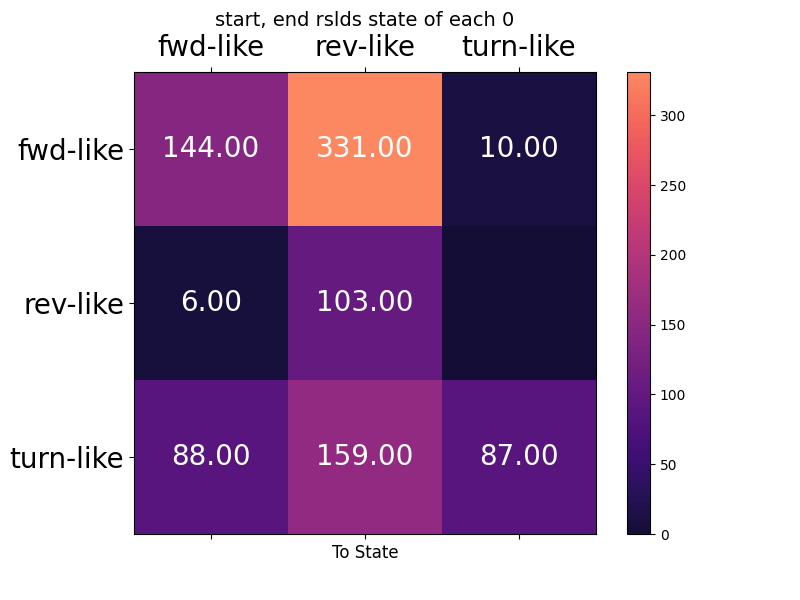

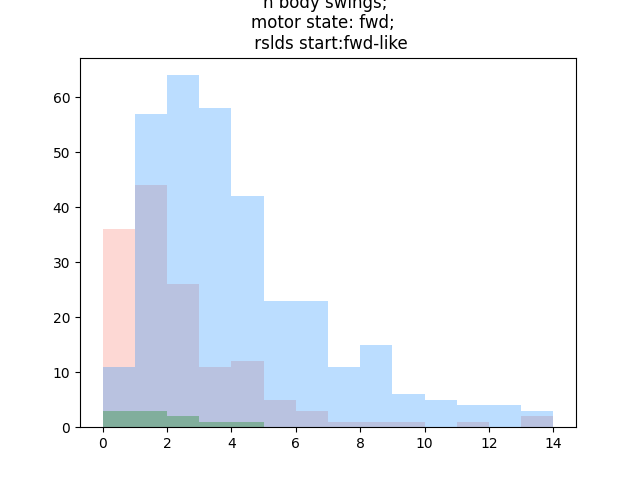

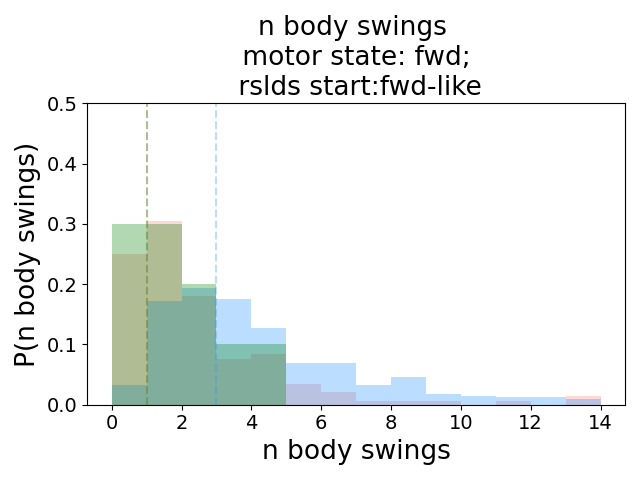

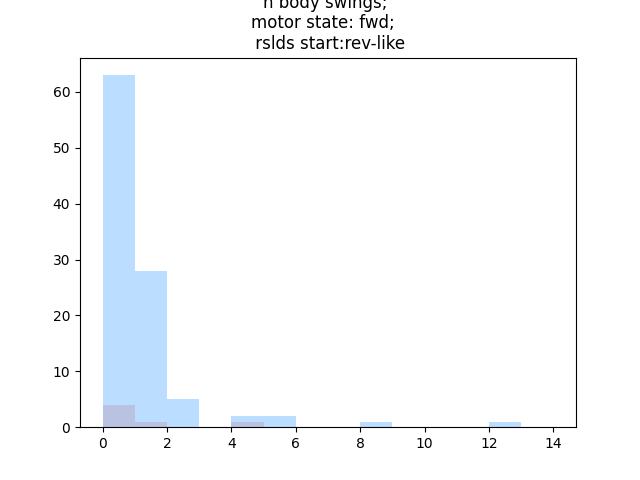

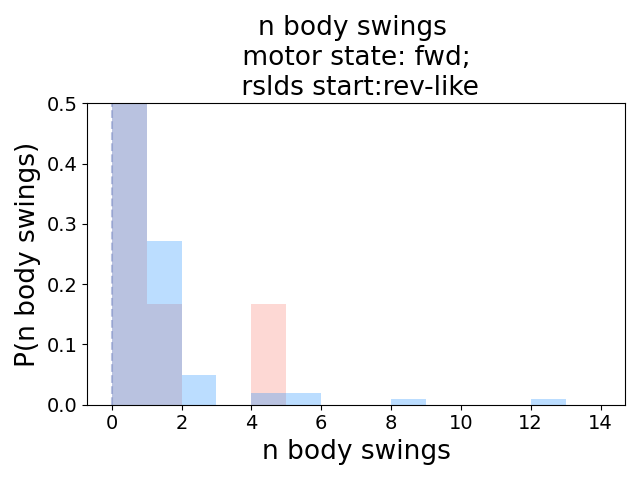

...

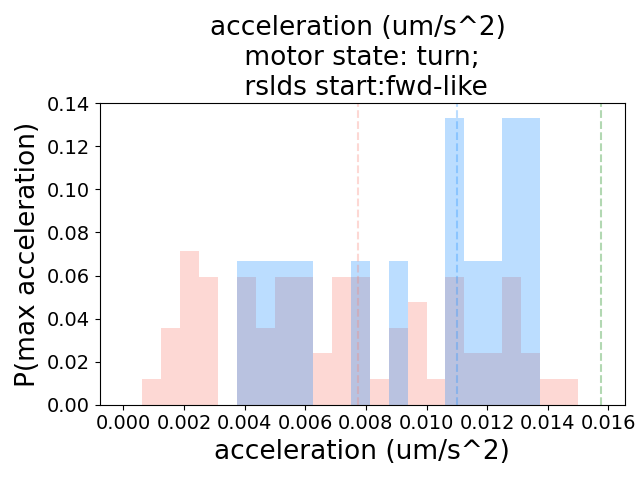

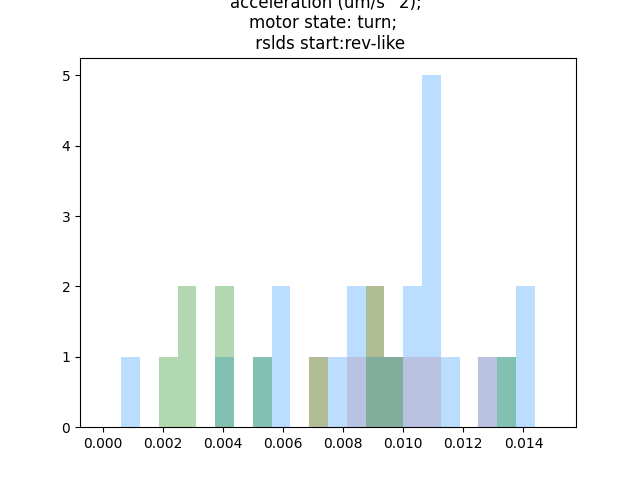

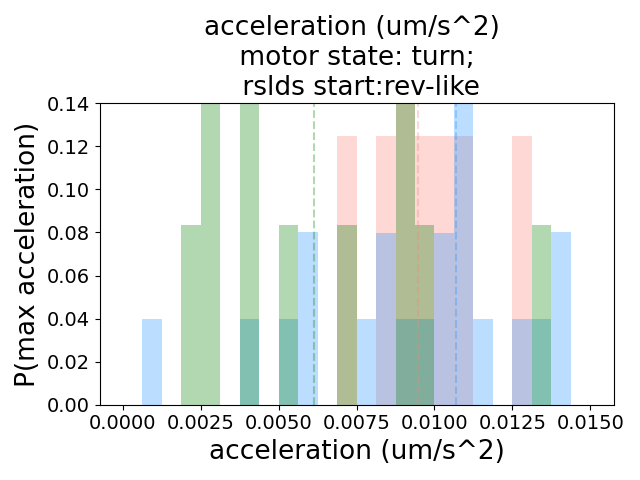

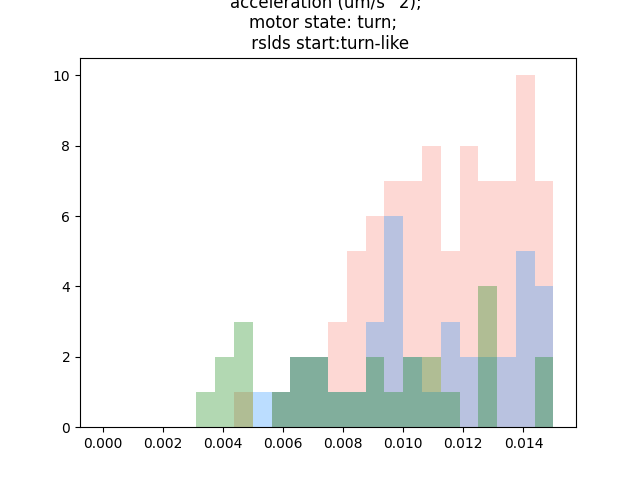

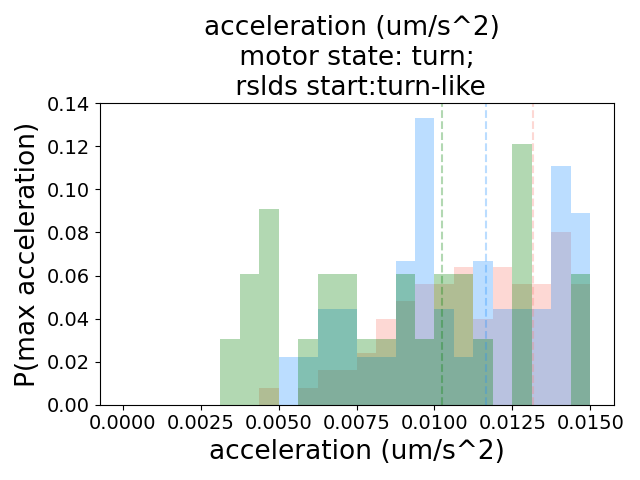

In [14]:
#

motor_state_to_feature_rslds_state_to_feature_vals = {}
motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is = {}
motor_states = [0,1,2]
for motor_state in motor_states:#[0,1,2]:
    
    
    rslds_state_to_exp_date_to_beh_start_end_is =  get_motor_state_start_end_is_rslds_start_end_specific(motor_state, exp_dates, z, q_z,  rslds_states = [0,1,2])
    motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is[motor_state] = rslds_state_to_exp_date_to_beh_start_end_is
    
    feature_rslds_state_to_feature_vals = get_features_from_start_end_is(feature_to_dict, rslds_state_to_exp_date_to_beh_start_end_is)
    motor_state_to_feature_rslds_state_to_feature_vals[motor_state] = feature_rslds_state_to_feature_vals
 


for motor_state in motor_states:#[0,1,2]:
    rslds_state_to_exp_date_to_beh_start_end_is = motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is[motor_state]
    counts = np.zeros((n_rslds_states+1, n_rslds_states+1))
    for (rslds_start_state, rslds_end_state) in rslds_state_to_exp_date_to_beh_start_end_is.keys():
        for date, (starts, ends) in rslds_state_to_exp_date_to_beh_start_end_is[(rslds_start_state, rslds_end_state)].items():
            counts[rslds_start_state, rslds_end_state]+= starts.shape[0]
    
    visualize_transition_matrix(counts, title = f"start, end rslds state of each {motor_state}",   labels= [rslds_state_num_to_name[i] for i in range(3)] )    
  
    
    
    feature_rslds_state_to_feature_vals =  motor_state_to_feature_rslds_state_to_feature_vals[motor_state]
    for feature, feature_params in feature_to_dict.items():#[list(feature_to_dict.items())[0]]: 
        print(feature)
        if  feature == "duration (s)": 
            
            continue
        for rslds_start_state in [0,1,2]:
            # fig, ax = plt.subplots()
            fig1, ax1 = plt.subplots()
            for rslds_end_state in [0,1,2]:
            
                feature_vals = feature_rslds_state_to_feature_vals[feature][(rslds_start_state, rslds_end_state )]
        
                # plot_probabilities_hist(np.array(feature_vals),
                #                         # bins= feature_to_dict[feature]["bins"], 
                #                         bins =  np.arange(0, 15, 1),
                #                         color = rslds_state_to_color[rslds_end_state], 
                #                         alpha = 0.5, label = rslds_state_to_label[rslds_end_state],
                #                         fig = fig, ax = ax, 
                #                         # ylim = None
                #                         )
                ax1.hist(np.array(feature_vals),
                                        # bins= feature_to_dict[feature]["bins"], 
                                        bins = feature_to_dict[feature]["bins"], # np.arange(0, 15, 1)
                                        color = rslds_state_to_color[rslds_end_state], 
                                        alpha = 0.3)
            # ax.set_title(f"{feature};motor state: {motor_state};  rslds start:{rslds_start_state}")
            ax1.set_title(f"{feature}; \nmotor state: {motor_state_num_to_name[motor_state]};  \n rslds start:{rslds_state_num_to_name[rslds_start_state]}")
            
            
            rslds_state_to_feature = {rslds_end_state: remove_nans(feature_rslds_state_to_feature_vals[feature][(rslds_start_state, rslds_end_state )]) for  rslds_end_state in [0,1,2] }
            fig1, ax1 = plt.subplots()
            plot_hist_across_conditins_and_get_KS_stats(rslds_state_to_feature,  rslds_state_to_color,
                                                    title = f"{feature} \n motor state: {motor_state_num_to_name[motor_state]}; \n rslds start:{rslds_state_num_to_name[rslds_start_state]}", 
                                                    ylabel = feature_to_dict[feature]["ylabel"],
                                                    xlabel = f"{feature}",
                                                    stat_color = "tomato" ,
                                                    bins = feature_to_dict[feature]["bins"], # np.arange(0, 15, 1)
                                                    ylim = feature_to_dict[feature]["ylim"], 
                                                    alpha = 0.3, 
                                                #    linewidth=2, 
                                                    fill =  True,
                                                    fig = fig1, 
                                                    ax = ax1 , 
                                                    print_sig = False,
                                                    print_effect_size = False, 
                                                    legend = False,
                                                    plot_medians = True
                                                    )
            



feature n body swings
featureseq 2022-06-14-01 [ 0.93240325  0.39915272 -0.22954079 ...  0.44078003  0.77507915
  0.99018028]
featureseq 2023-01-23-08 [-0.17034776 -0.47173919 -0.6212412  ... -0.38840332  0.06307529
  0.35520242]
featureseq 2022-06-28-07 [-1.32306617 -1.21076867 -0.94837949 ...  0.43785111  0.32150092
 -0.47546333]
featureseq 2022-07-15-12 [ 0.65652251  0.07185578 -0.4266494  ... -0.33675424 -0.0839305
  0.07476969]
featureseq 2023-01-19-01 [-0.49905002 -0.49151537 -0.48190662 ...  0.48674987  0.50572106
  0.56288608]
featureseq 2022-08-02-01 [0.82877768 0.66669446 0.53437445 ... 0.15573511 0.37133987 0.28298357]
featureseq 2022-06-14-07 [ 0.97254172  0.36741761 -0.3429651  ...  1.13236739  0.99286936
  0.26572943]
featureseq 2022-06-28-01 [-0.26577939 -0.66513897 -0.79227162 ... -0.48064921 -0.28128218
 -0.25168671]
featureseq 2023-01-23-15 [-0.01740461  0.31583892  0.5850379  ...  0.21641419 -0.40456777
 -0.68654143]
featureseq 2022-07-26-01 [ 0.62737376  0.86792242 

/var/folders/8z/xy4sl8b90qnc_x9p_4psrnmh0000gn/T/ipykernel_16864/333488331.py:68: RuntimeWarning: All-NaN slice encountered
  "feature_fnc":  lambda x: np.nanmax(np.abs(x)),


[3.10966942 2.99731175 2.91089929 ... 1.9365917  2.0499628  2.31377771]
featureseq 2022-06-28-07 [ 8.82080056 10.15566677 11.3674533  ...  3.12186563  2.49661511
  3.13789753]
featureseq 2022-07-15-12 [4.2899044  4.21792513 3.02026355 ... 2.47645645 2.47224453 2.44784352]
featureseq 2023-01-19-01 [ 5.62972166  5.80615691  6.05585382 ... 11.29312451 11.21114614
 11.103329  ]
featureseq 2022-08-02-01 [4.58445212 4.56306553 4.88972013 ... 1.65702331 1.37317813 1.92630057]
featureseq 2022-06-14-07 [6.66058249 5.6884737  4.6824164  ... 4.91889029 4.87414281 5.02675066]
featureseq 2022-06-28-01 [7.23539705 8.11434229 8.22342617 ... 2.95198742 2.91989354 2.92948034]
featureseq 2023-01-23-15 [3.6391993  2.98944256 2.88569911 ... 4.65880184 2.32609013 2.76012851]
featureseq 2022-07-26-01 [ 4.23321621  3.97626954  3.73425441 ...  9.96390281 11.29421016
 11.51968173]
featureseq 2023-01-19-15 [4.23264929 3.39515145 3.26428289 ... 3.7007094  3.38739249 3.18496083]
featureseq 2023-03-07-01 [5.131587

/var/folders/8z/xy4sl8b90qnc_x9p_4psrnmh0000gn/T/ipykernel_16864/1923656423.py:56: RuntimeWarning: invalid value encountered in divide
  cdf = cdf / cdf[-1]


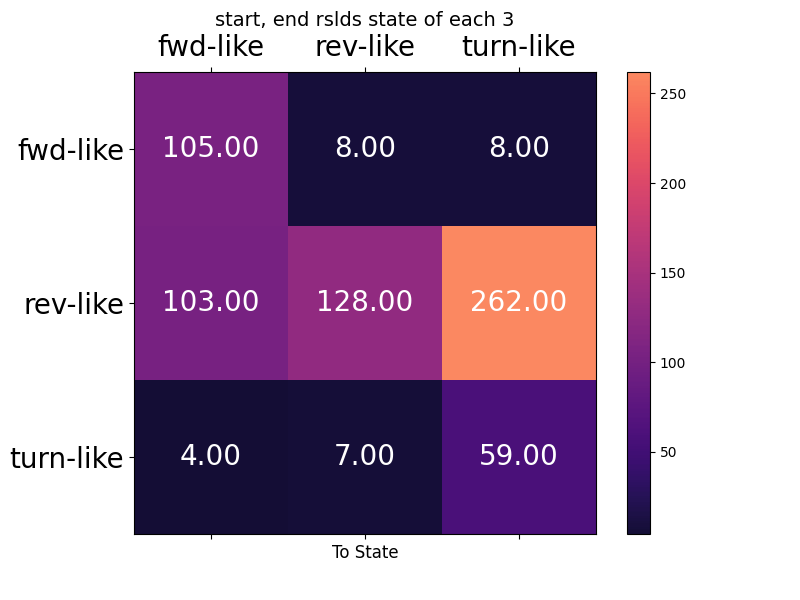

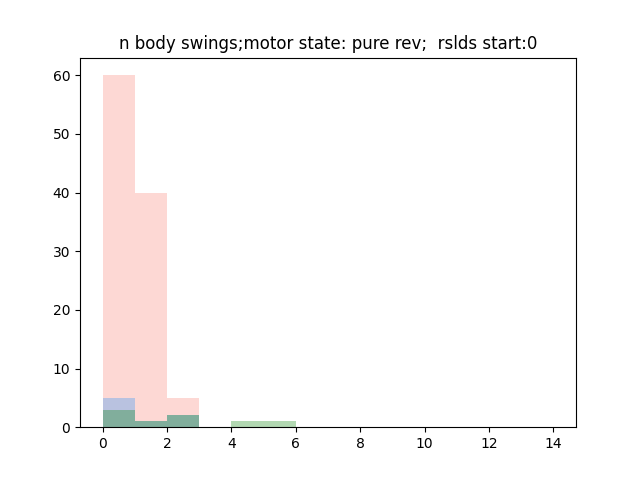

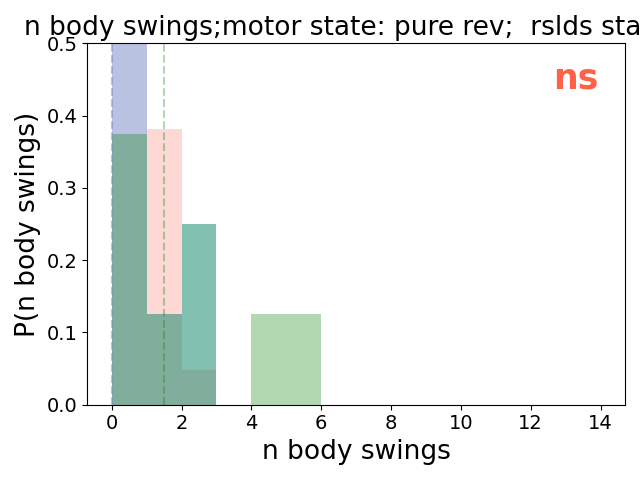

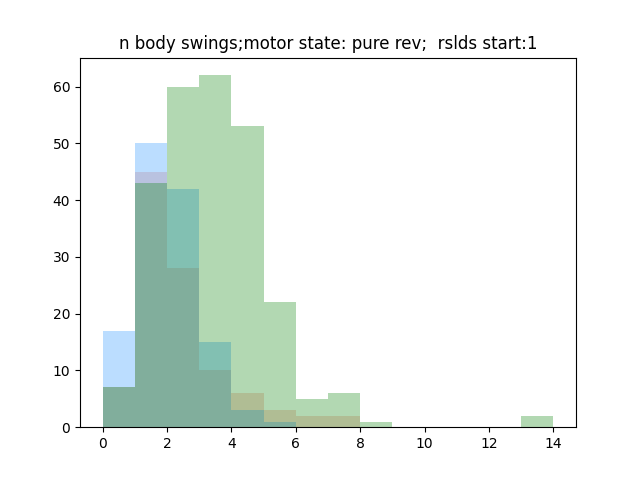

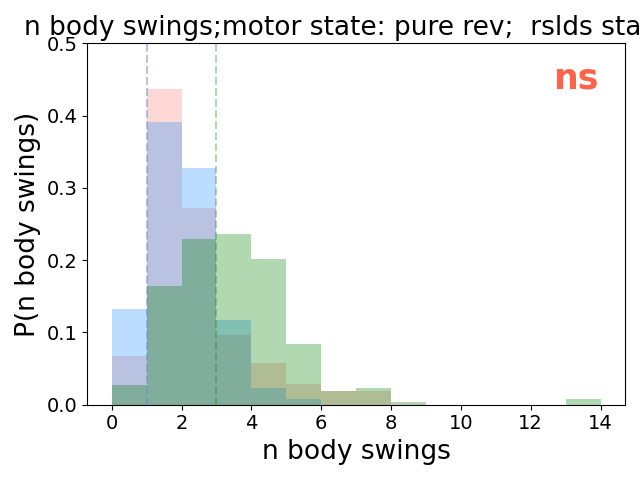

...

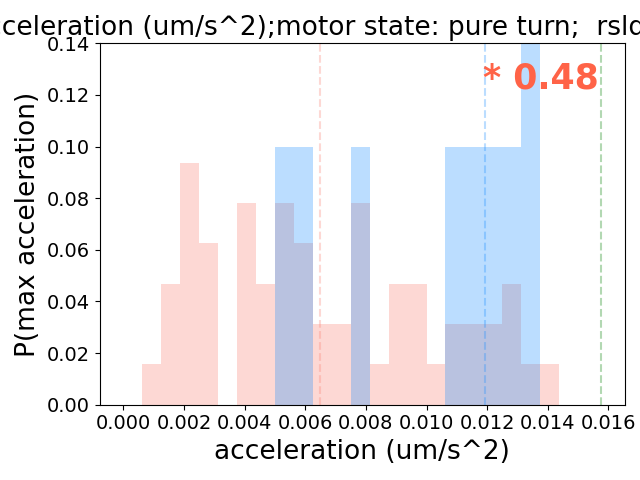

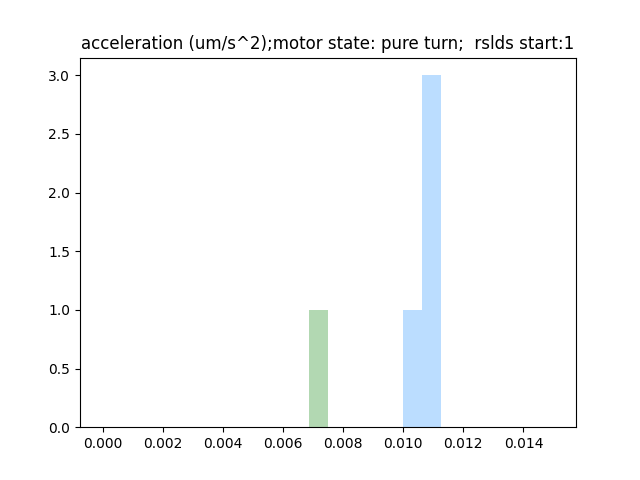

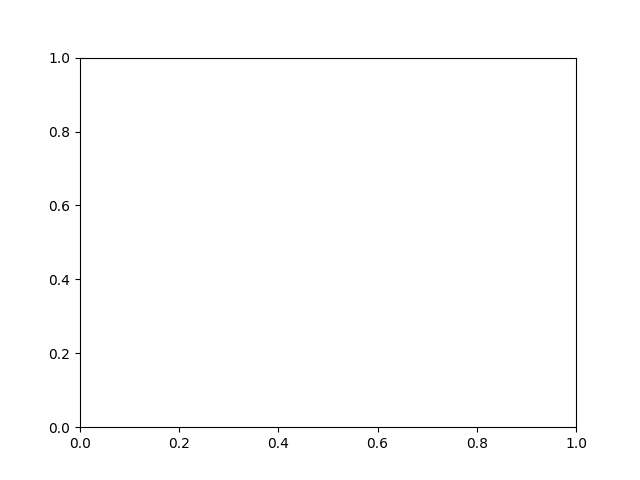

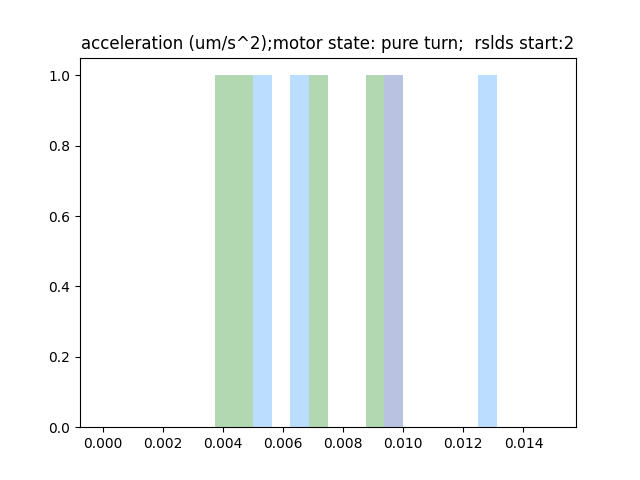

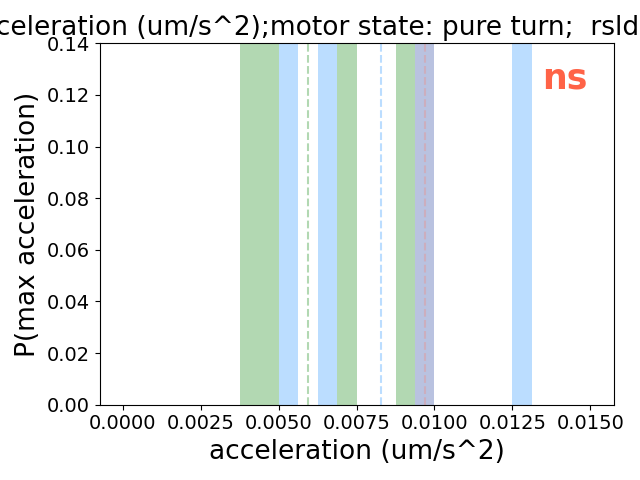

In [15]:
motor_state_to_feature_rslds_state_to_feature_vals = {}
motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is = {}
motor_states = [3,4,5,6]
beh_list = [exp_date_to_reor_type[date] for date in exp_dates]
for motor_state in motor_states:#[0,1,2]:
   
    
    rslds_state_to_exp_date_to_beh_start_end_is =  get_motor_state_start_end_is_rslds_start_end_specific(motor_state, exp_dates, beh_list, q_z,  rslds_states = [0,1,2])
    motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is[motor_state] = rslds_state_to_exp_date_to_beh_start_end_is
    
    feature_rslds_state_to_feature_vals = get_features_from_start_end_is(feature_to_dict, rslds_state_to_exp_date_to_beh_start_end_is)
    motor_state_to_feature_rslds_state_to_feature_vals[motor_state] = feature_rslds_state_to_feature_vals
 


for motor_state in motor_states:#[0,1,2]:
    rslds_state_to_exp_date_to_beh_start_end_is = motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is[motor_state]
    counts = np.zeros((n_rslds_states+1, n_rslds_states+1))
    for (rslds_start_state, rslds_end_state) in rslds_state_to_exp_date_to_beh_start_end_is.keys():
        for date, (starts, ends) in rslds_state_to_exp_date_to_beh_start_end_is[(rslds_start_state, rslds_end_state)].items():
            counts[rslds_start_state, rslds_end_state]+= starts.shape[0]
    
    visualize_transition_matrix(counts, title = f"start, end rslds state of each {motor_state}",  labels= [rslds_state_num_to_name[i] for i in range(3)] )       
    
    
    feature_rslds_state_to_feature_vals =  motor_state_to_feature_rslds_state_to_feature_vals[motor_state]
    for feature, feature_params in feature_to_dict.items():#[list(feature_to_dict.items())[0]]: 
        print(feature)
        if  feature == "duration (s)": 
            
            continue
        for rslds_start_state in [0,1,2]:
            # fig, ax = plt.subplots()
            fig1, ax1 = plt.subplots()
            for rslds_end_state in [0,1,2]:
            
                feature_vals = feature_rslds_state_to_feature_vals[feature][(rslds_start_state, rslds_end_state )]
        
                # plot_probabilities_hist(np.array(feature_vals),
                #                         # bins= feature_to_dict[feature]["bins"], 
                #                         bins =  np.arange(0, 15, 1),
                #                         color = rslds_state_to_color[rslds_end_state], 
                #                         alpha = 0.5, label = rslds_state_to_label[rslds_end_state],
                #                         fig = fig, ax = ax, 
                #                         # ylim = None
                #                         )
                ax1.hist(np.array(feature_vals),
                                        # bins= feature_to_dict[feature]["bins"], 
                                        bins = feature_to_dict[feature]["bins"], # np.arange(0, 15, 1)
                                        color = rslds_state_to_color[rslds_end_state], 
                                        alpha = 0.3)
            # ax.set_title(f"{feature};motor state: {motor_state};  rslds start:{rslds_start_state}")
            ax1.set_title(f"{feature};motor state: {motor_state_num_to_name[motor_state]};  rslds start:{rslds_start_state}")
            
            
            rslds_state_to_feature = {rslds_end_state: remove_nans(feature_rslds_state_to_feature_vals[feature][(rslds_start_state, rslds_end_state )]) for  rslds_end_state in [0,1,2] }
            fig1, ax1 = plt.subplots()
            if np.all([len(vals)>0 for key, vals in rslds_state_to_feature.items() ]):
                plot_hist_across_conditins_and_get_KS_stats(rslds_state_to_feature,  rslds_state_to_color,
                                                        title = f"{feature};motor state: {motor_state_num_to_name[motor_state]};  rslds start:{rslds_start_state}", 
                                                        ylabel = feature_to_dict[feature]["ylabel"],
                                                        xlabel = f"{feature}",
                                                        stat_color = "tomato" ,
                                                        bins = feature_to_dict[feature]["bins"], # np.arange(0, 15, 1)
                                                        ylim = feature_to_dict[feature]["ylim"], 
                                                        alpha = 0.3, 
                                                    #    linewidth=2, 
                                                        fill =  True,
                                                        fig = fig1, 
                                                        ax = ax1 , 
                                                        print_sig = True,
                                                        print_effect_size = True, 
                                                        legend = False,
                                                        plot_medians = True
                                                        )

[0 1]
[0 1 2]
[0 2]
[0 1]
[0 1 2]
s
[0 2]
[0 1 2]
[0 2]
[0 1 2]
[0 1]
[0 1 2]
[0 1 2]
[0 1 2]
s
[1 2]
[0 1 2]
[1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 2]
[0 1 2]
[0 1 2]
s
[1 2]
[0 1 2]
[0 1 2]
[0 1 2]


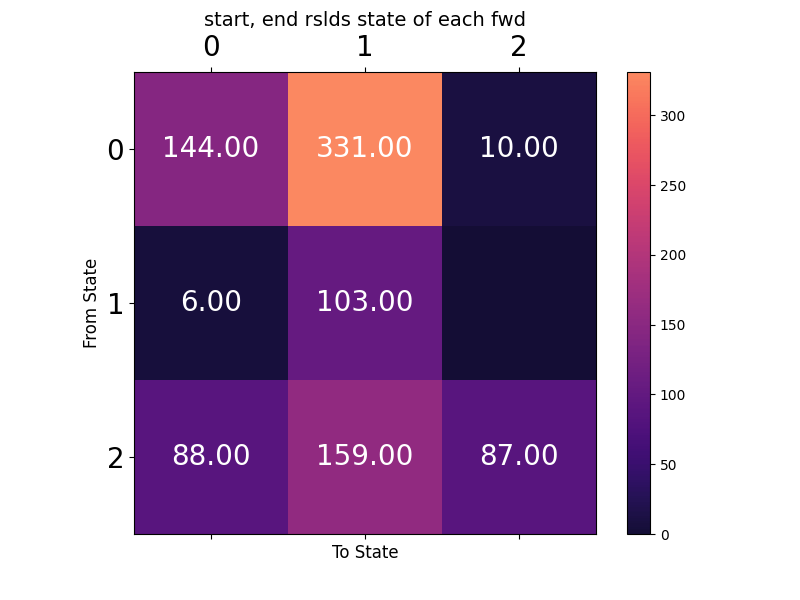

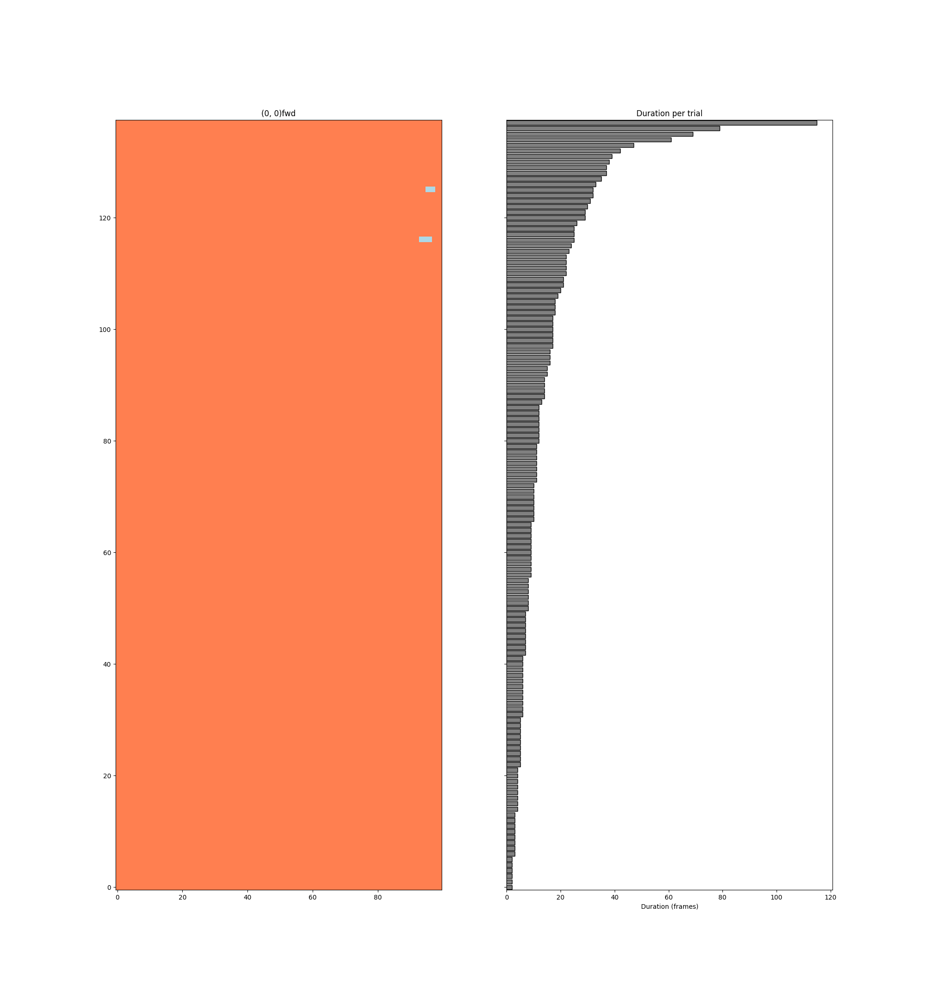

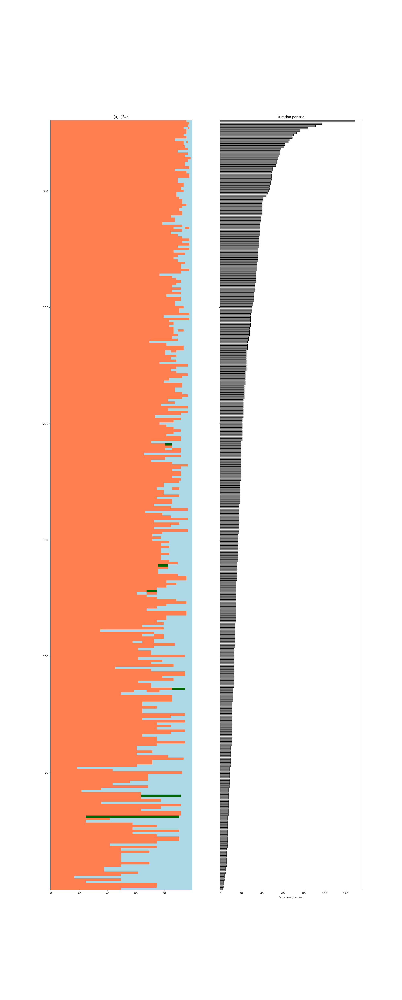

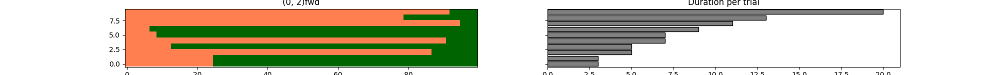

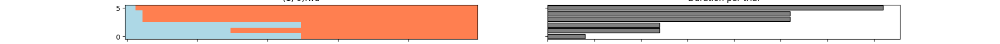

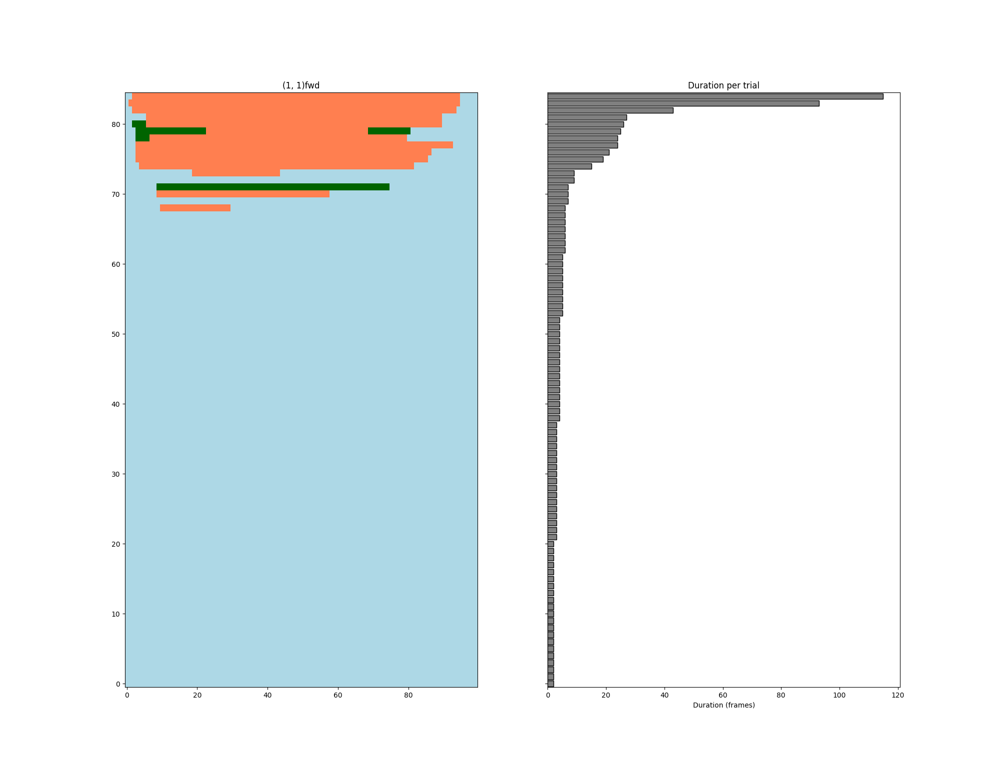

SystemError: tile cannot extend outside image

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous view', 'arrow-left', 'back'), ('Forward', 'Forward to next view', 'arrow-right', 'forward'), ('Pan', 'Left button pans, Right button zooms\nx/y fixes axis, CTRL fixes aspect', 'arrows', 'pan'), ('Zoom', 'Zoom to rectangle\nx/y fixes axis', 'square-o', 'zoom'), ('Download', 'Download plot', 'floppy-o', 'save_figure')]))

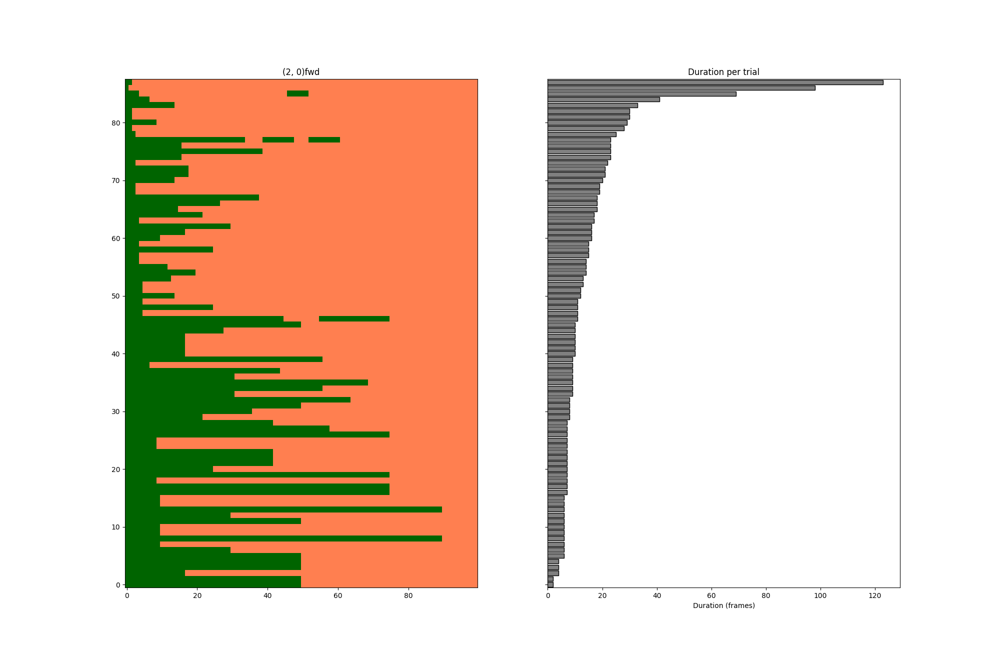

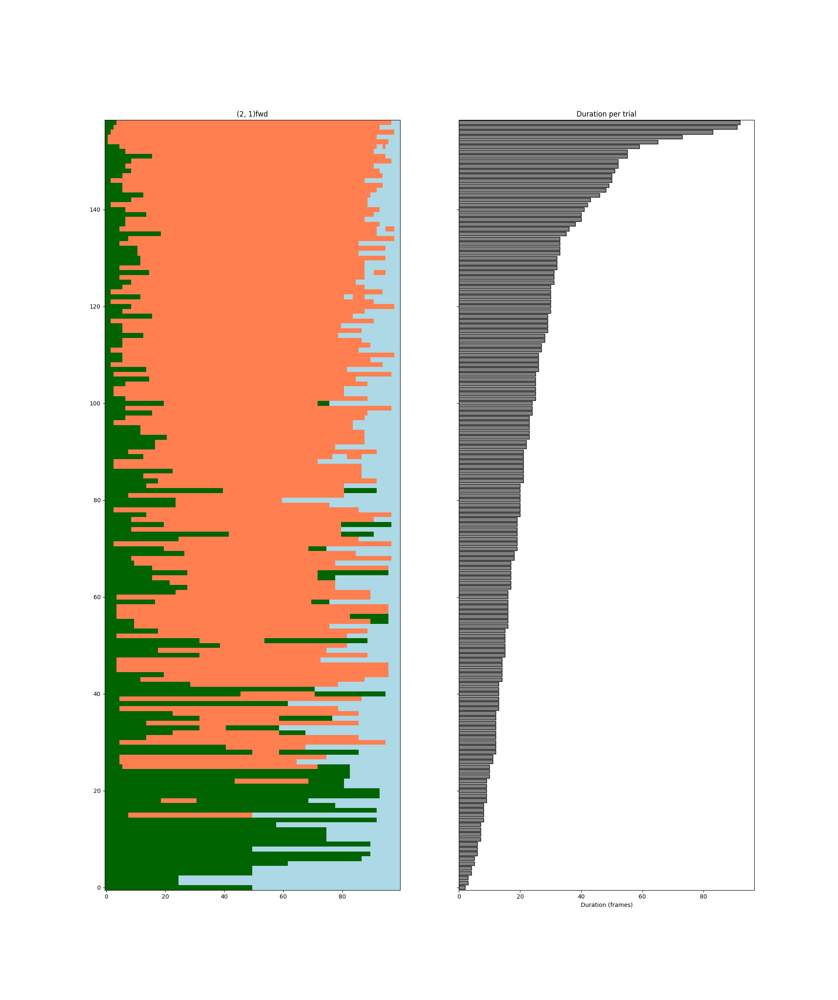

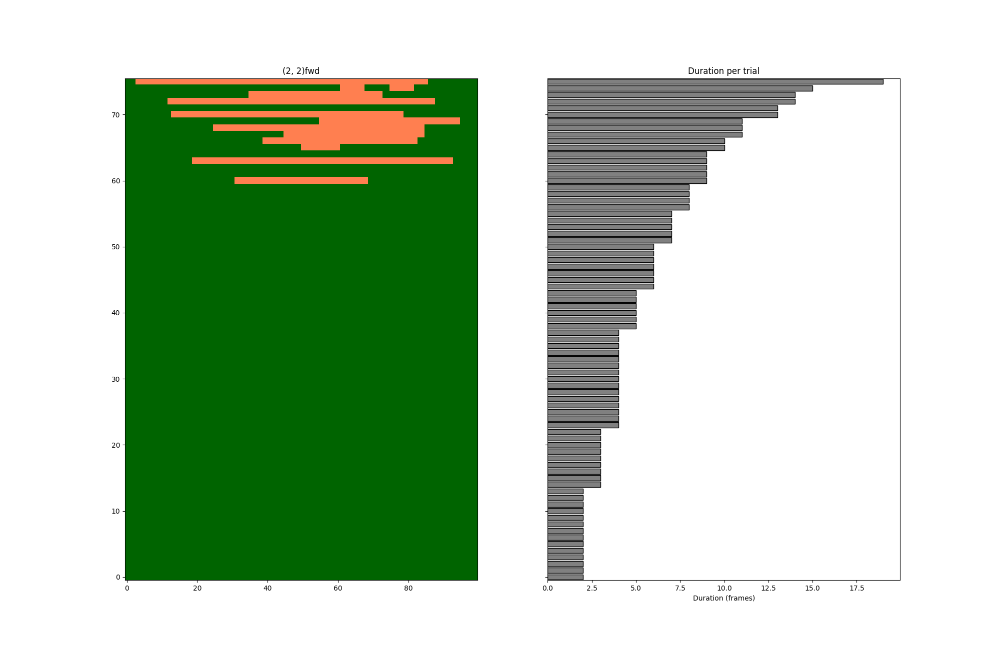

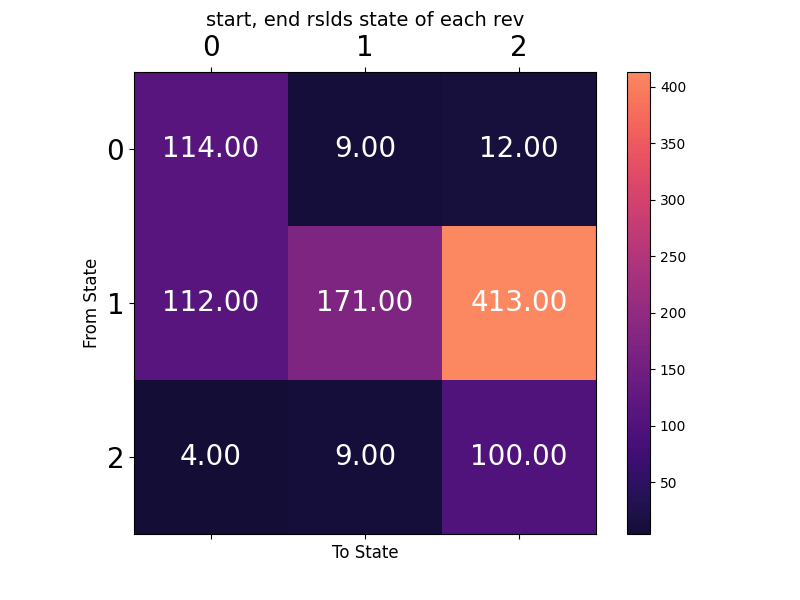

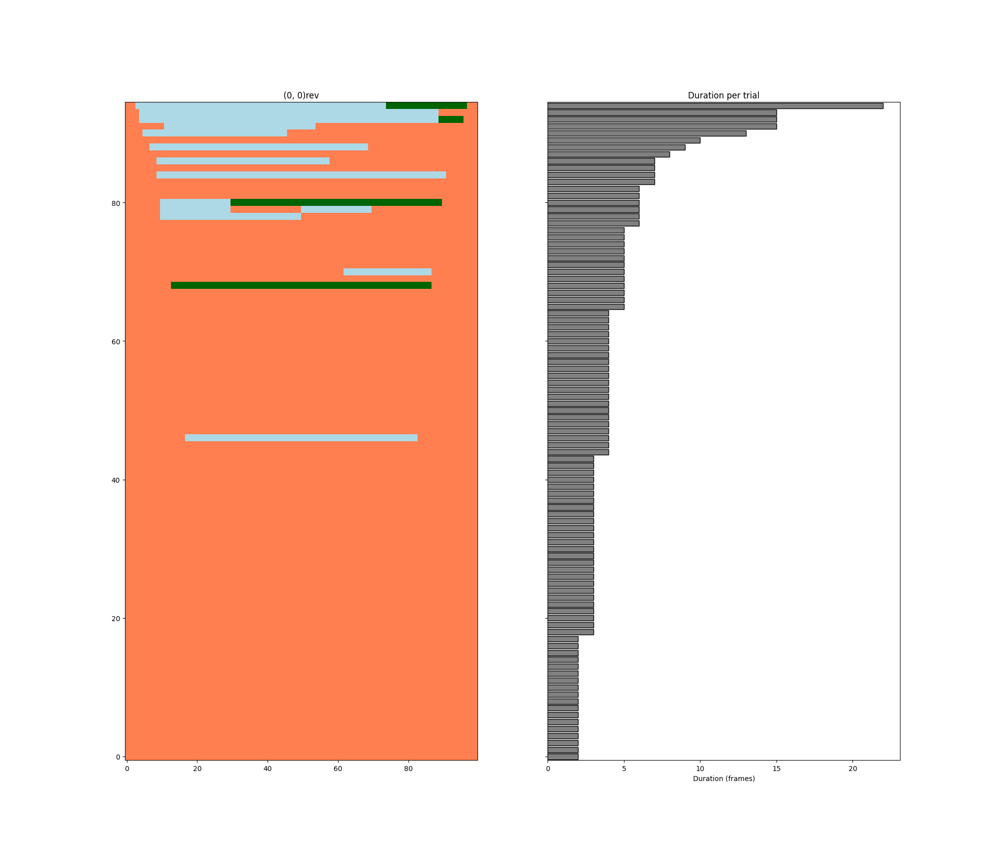

...

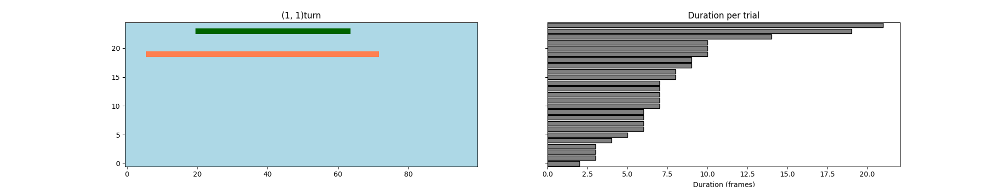

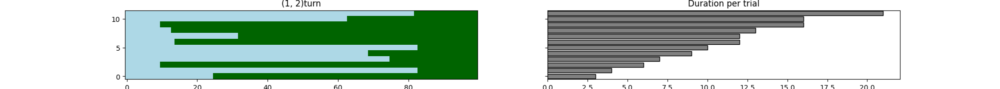

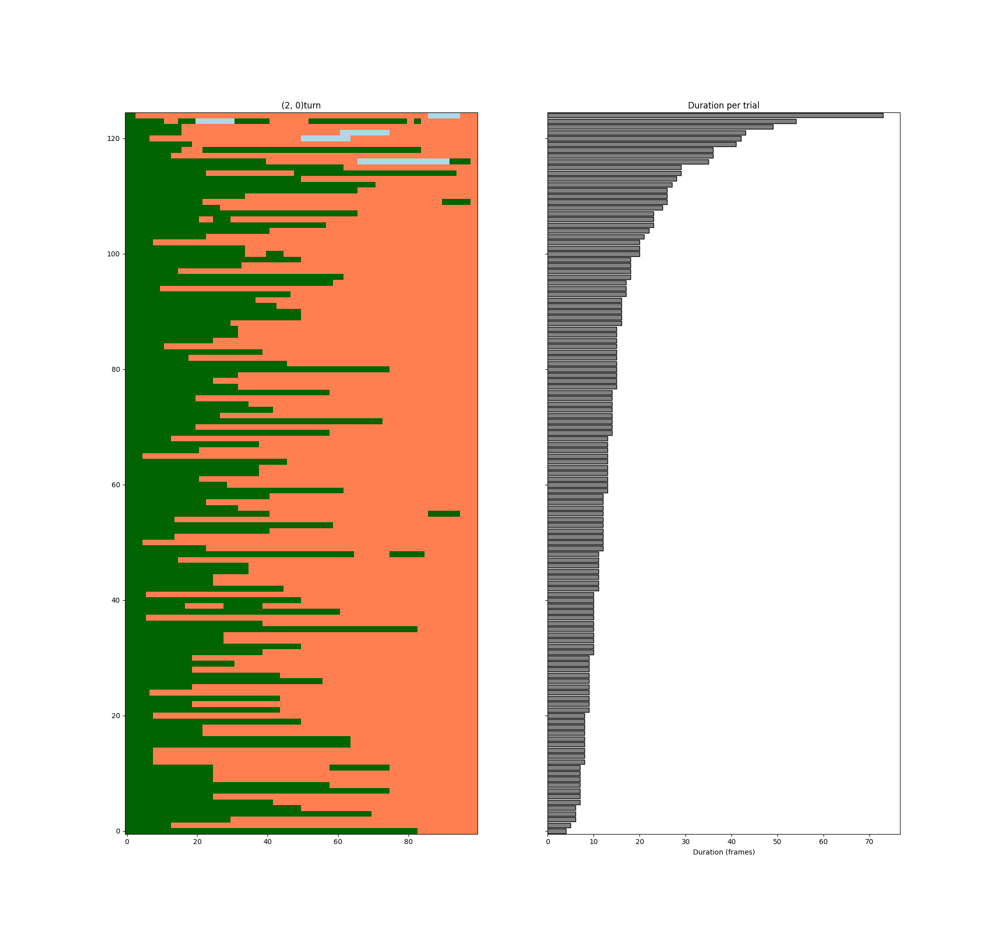

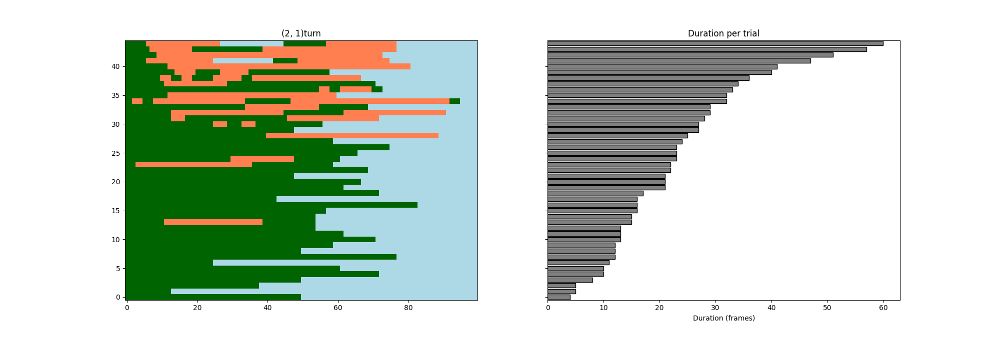

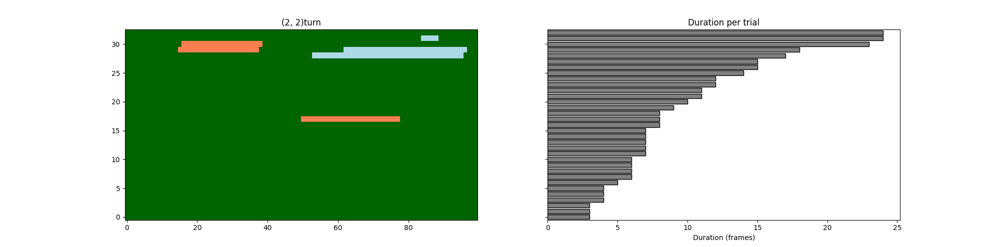

In [16]:
'''
 need to look into when during the motor state the switch occurs  
    -for each categorization, the normalized length event how much time is spent in each state sorted by duration and  also duration as a bar graph on the side 
'''
import numpy as np
from scipy.interpolate import interp1d

def interpolates_discrete(labels, n_target = 100 ):

    # # Original array of class labels
    # labels = np.array([1, 1, 2, 2, 3, 3, 3, 2, 1])  # example input
    n_original = len(labels)

    # Target number of frames
    n_target = 100

    # Create interpolation function using nearest-neighbor
    interp_func = interp1d(np.linspace(0, 1, n_original),
                        labels,
                        kind='nearest')

    # Interpolate to 100 frames
    interpolated_labels = interp_func(np.linspace(0, 1, n_target)).astype(int)
    return interpolated_labels

#
row_height = 0.15  # adjust as needed
col_width = 0.1    # adjust as needed
motor_state_to_feature_rslds_state_to_feature_vals = {}
motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is = {}
motor_states = [0,1,2]
for motor_state in motor_states:#[0,1,2]:
    
    
    rslds_state_to_exp_date_to_beh_start_end_is =  get_motor_state_start_end_is_rslds_start_end_specific(motor_state, exp_dates, z, q_z,  rslds_states = [0,1,2])
    motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is[motor_state] = rslds_state_to_exp_date_to_beh_start_end_is
    

#color palette for plotting, colors as in make_behavior_ethogram
palette = ["coral",     # forward
        "lightblue", # reverse
        "darkgreen", # turn
        # "purple","red", "yellow", "black", "pink"
        ]    # pause
cmap = LinearSegmentedColormap.from_list("behavior", palette, N=len(palette))


rslds_state_to_exp_date_to_beh_start_end_is[(rslds_start_state, rslds_end_state)][date]

for motor_state in motor_states: 
    rslds_state_to_exp_date_to_beh_start_end_is = motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is[motor_state]
    
    counts = np.zeros((n_rslds_states+1, n_rslds_states+1))
    for (rslds_start_state, rslds_end_state) in rslds_state_to_exp_date_to_beh_start_end_is.keys():
        for date, (starts, ends) in rslds_state_to_exp_date_to_beh_start_end_is[(rslds_start_state, rslds_end_state)].items():
            counts[rslds_start_state, rslds_end_state]+= starts.shape[0]
    
    visualize_transition_matrix(counts, title = f"start, end rslds state of each {motor_state_num_to_name[motor_state]}",  labels=None)       
    
    for rslds_start_state, rslds_end_state in rslds_state_to_exp_date_to_beh_start_end_is.keys():
    # for rslds_start_state, rslds_end_state in [(1,2)]:
        if rslds_start_state ==1 and rslds_end_state ==2:
            print("s")
        date_to_beh_start_ends = rslds_state_to_exp_date_to_beh_start_end_is[(rslds_start_state, rslds_end_state)] 
        # fig,axs = plt.subplots(1,2, sharey = True)
        n_rows = counts[rslds_start_state, rslds_end_state]
        n_cols = 100
        figsize = (n_cols * col_width*2, n_rows * row_height)
        fig, axs = plt.subplots(1,2, figsize=figsize, sharey = True)

        # fig, ax = plt.subplots()
        # axs = [ax]
       
        # n_tracks = 100 
        rslds_clips = []
        durations = []
        for i, date in enumerate(exp_dates):
            beh_starts, beh_ends = date_to_beh_start_ends[date]
            rslds_seq = q_z[i]
            for start, end in zip(beh_starts, beh_ends):
                duration = end-start
                if duration ==1: 
                    continue
                durations.append(duration)
                rslds_clip = rslds_seq[start:end]
                rslds_clip_normalized =  interpolates_discrete(rslds_clip, n_target = 100 )###but interpoalte into discret states--can make longer or?
                rslds_clips.append(rslds_clip_normalized.astype('int'))
        if len(rslds_clips) ==0: 
            continue
        rslds_clips = np.array(rslds_clips)
        durations = np.array(durations)
        print(np.unique(rslds_clips))
        sort_i = np.argsort(durations)
        rslds_clips = rslds_clips[sort_i]
        durations = durations[sort_i]


        ax = axs[0]
        axs[0].imshow(np.array(rslds_clips), cmap = cmap,vmin=0, vmax=len(palette)-1,  aspect='auto')
        ax.set_title(f"{rslds_start_state, rslds_end_state }{motor_state_num_to_name[motor_state]}")
        
        ax1 = axs[1]
        # Plot the durations as a horizontal bar plot
        y_pos = np.arange(len(durations))  # One bar per row/trial
        ax1.barh(y_pos, durations, color='gray', edgecolor='k')
        ax1.set_ylim(ax.get_ylim())  # Align y-axis with the heatmap
        ax1.invert_yaxis()  # Match imshow orientation (top = 0)
        ax1.set_xlabel("Duration (frames)")
        ax1.set_title("Duration per trial")

        # plt.tight_layout()



[0 1 2]
[0 1]
[0 1 2]
[0 1 2]
[0 1 2]
[1 2]
[0 1 2]
[1 2]
[0 1 2]
[0]
[0 1]
[0 2]
[0 1 2]
[1]
[1 2]
[1 2]
[1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 2]
[1]
[1 2]
[0 2]
[1 2]
[2]


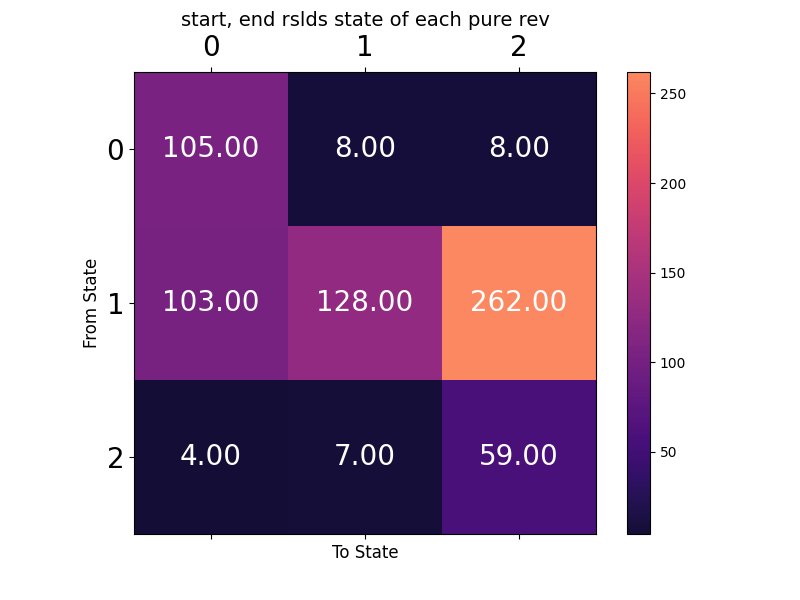

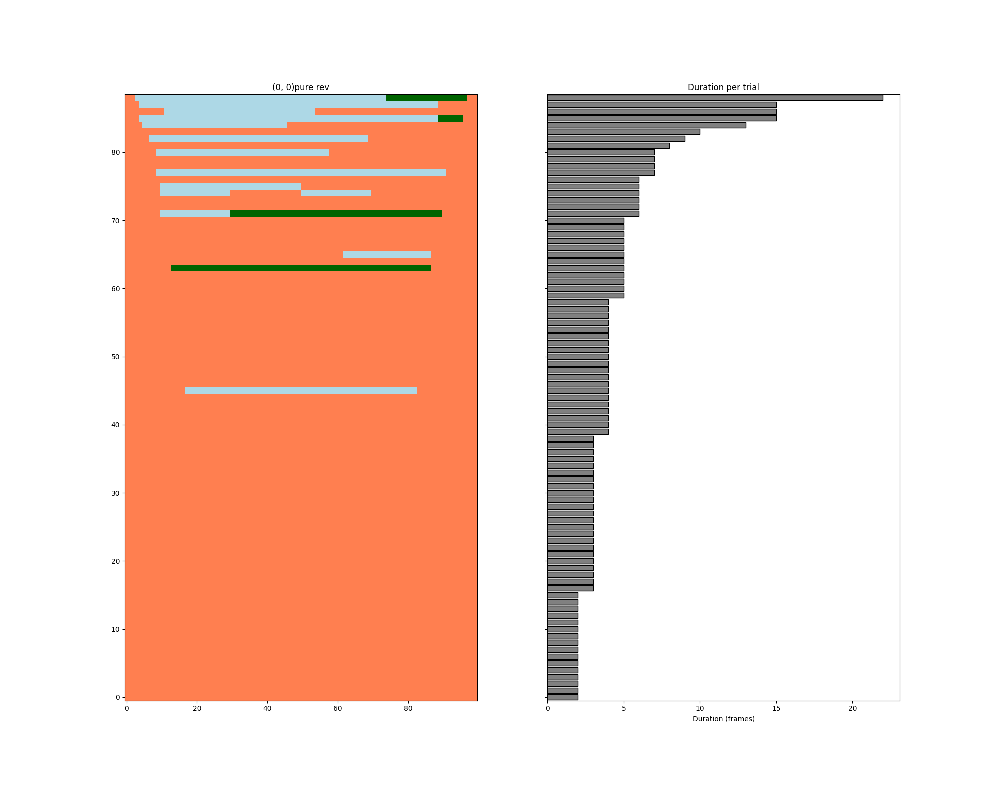

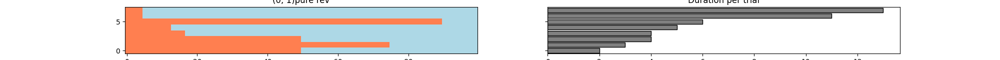

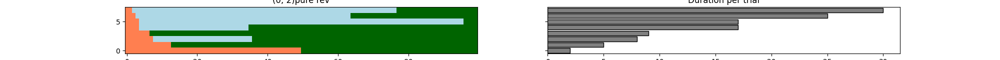

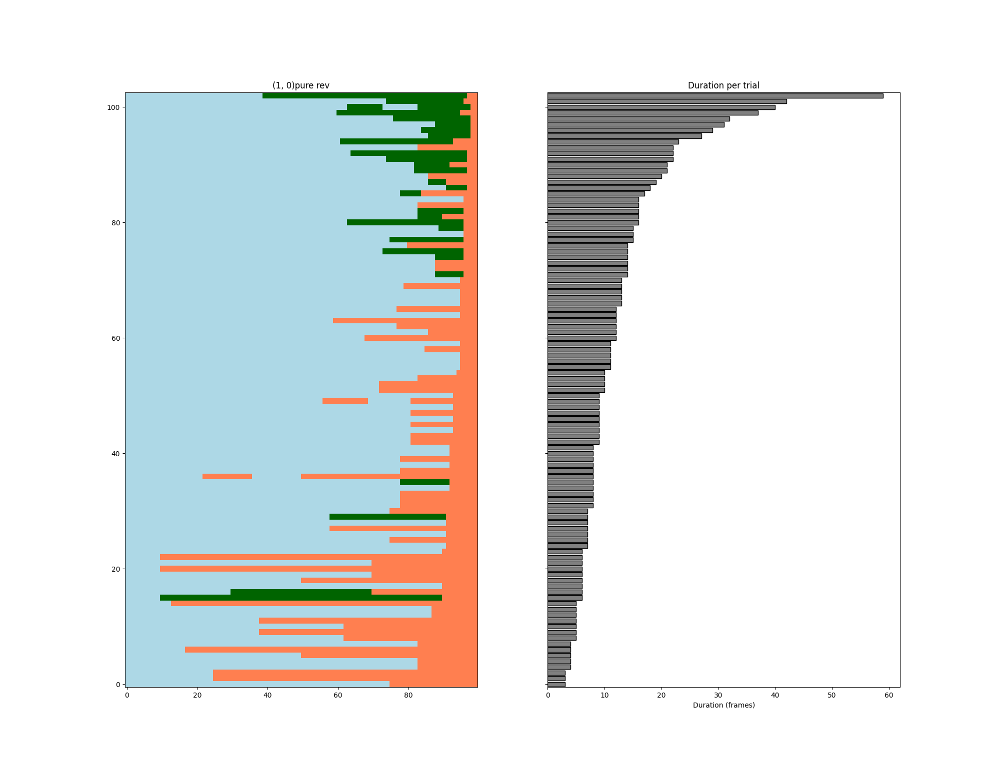

...

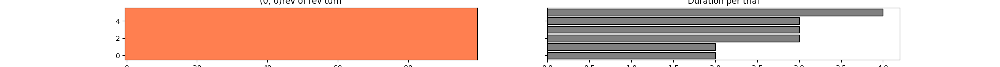

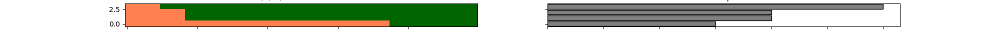

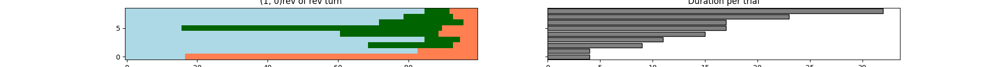

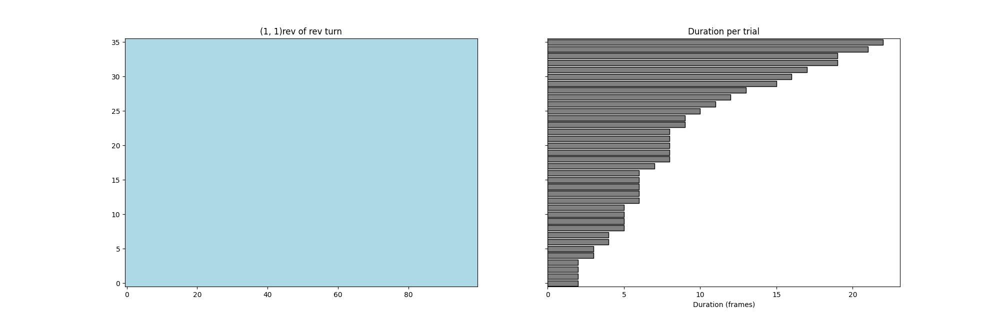

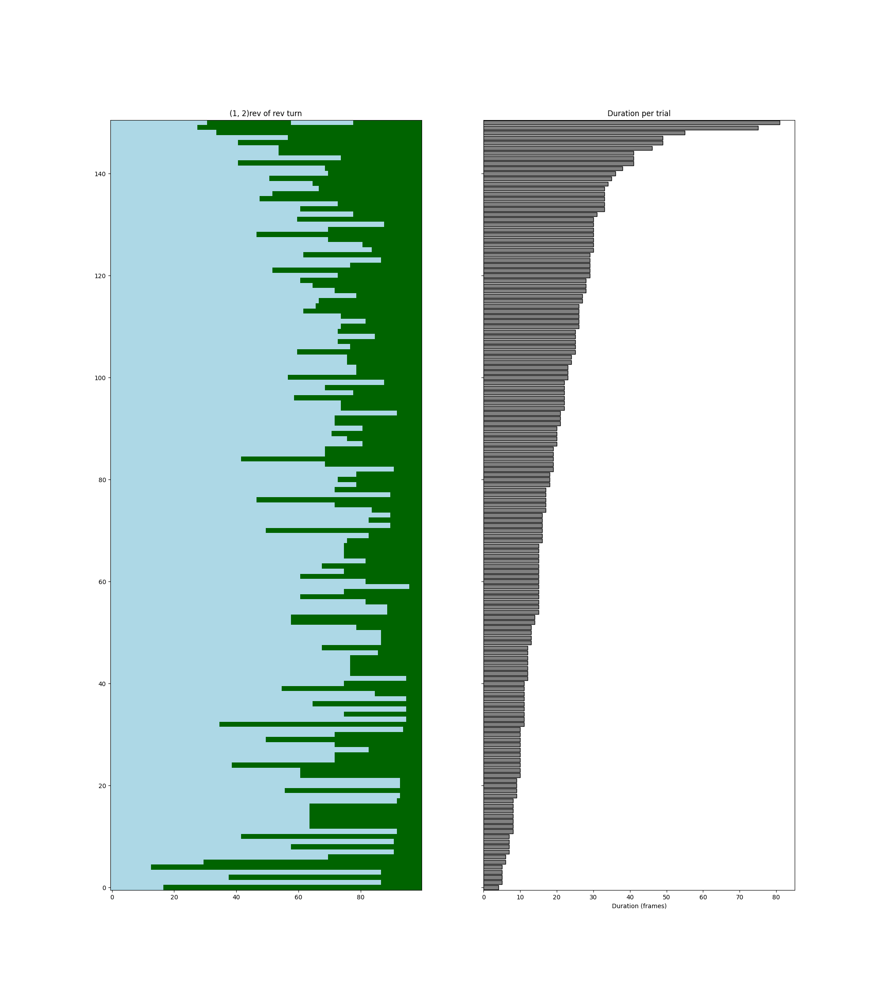

SystemError: tile cannot extend outside image

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous view', 'arrow-left', 'back'), ('Forward', 'Forward to next view', 'arrow-right', 'forward'), ('Pan', 'Left button pans, Right button zooms\nx/y fixes axis, CTRL fixes aspect', 'arrows', 'pan'), ('Zoom', 'Zoom to rectangle\nx/y fixes axis', 'square-o', 'zoom'), ('Download', 'Download plot', 'floppy-o', 'save_figure')]))

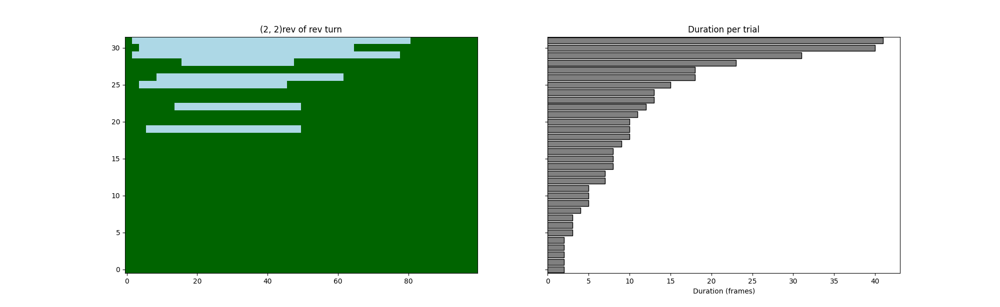

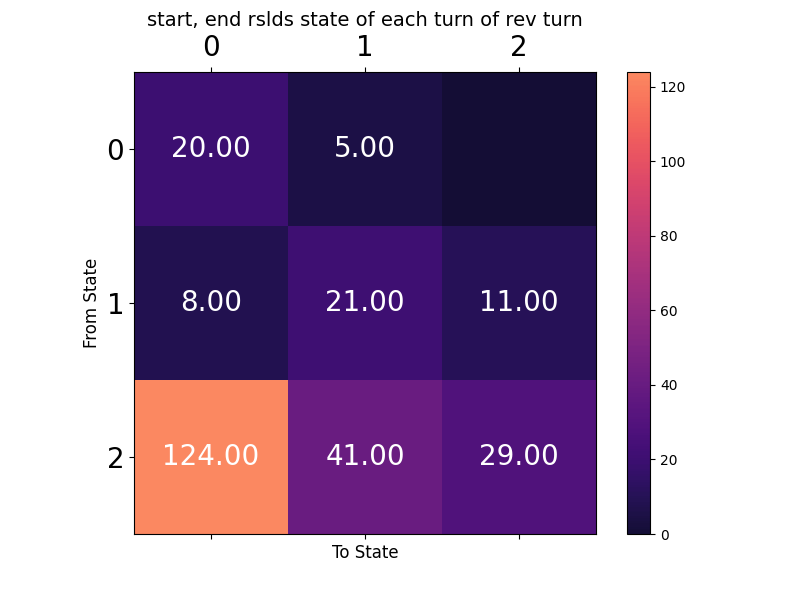

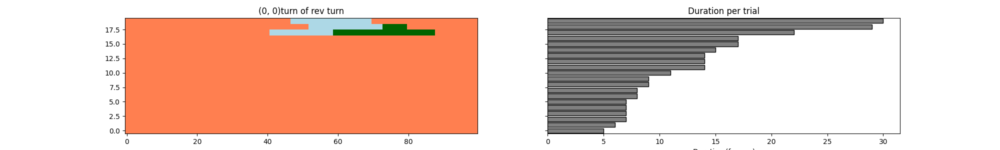

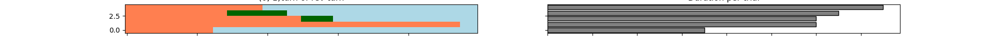

SystemError: tile cannot extend outside image

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous view', 'arrow-left', 'back'), ('Forward', 'Forward to next view', 'arrow-right', 'forward'), ('Pan', 'Left button pans, Right button zooms\nx/y fixes axis, CTRL fixes aspect', 'arrows', 'pan'), ('Zoom', 'Zoom to rectangle\nx/y fixes axis', 'square-o', 'zoom'), ('Download', 'Download plot', 'floppy-o', 'save_figure')]))

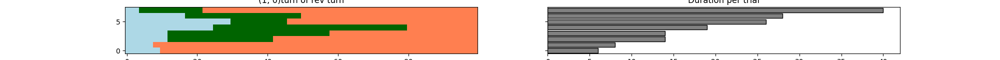

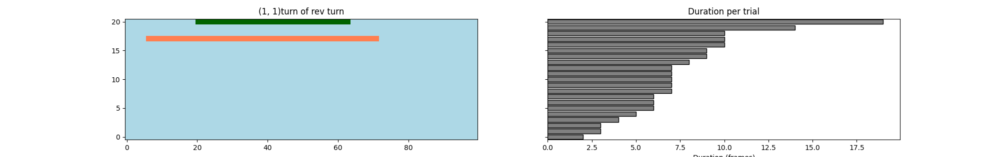

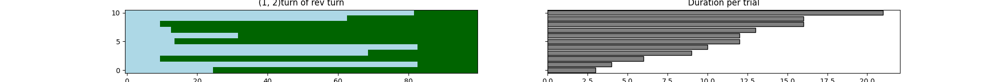

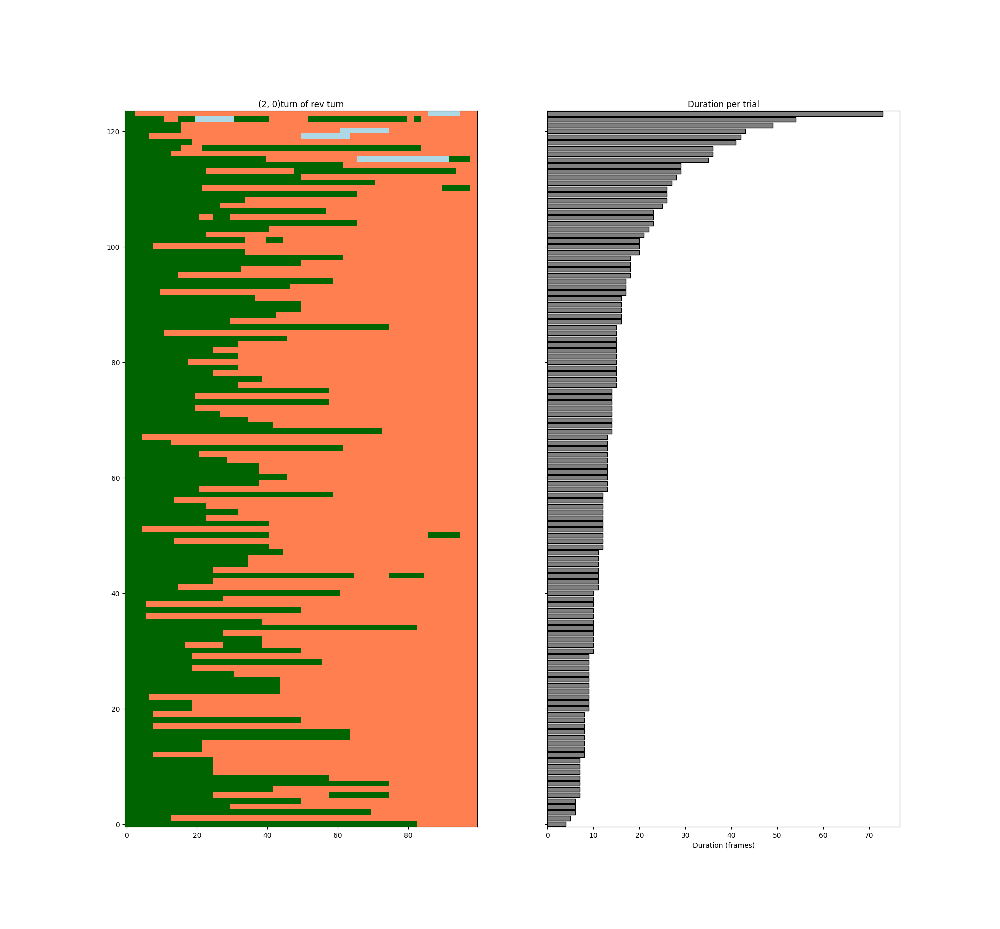

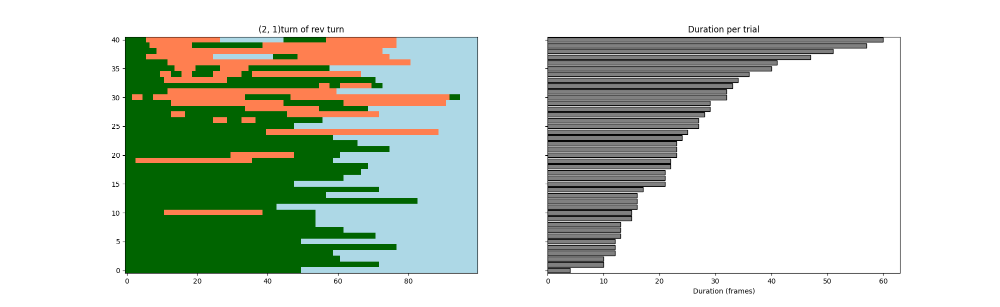

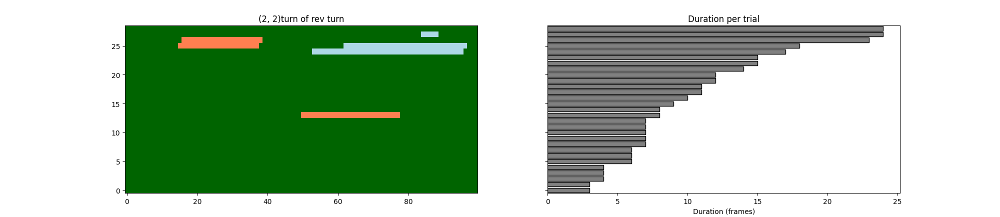

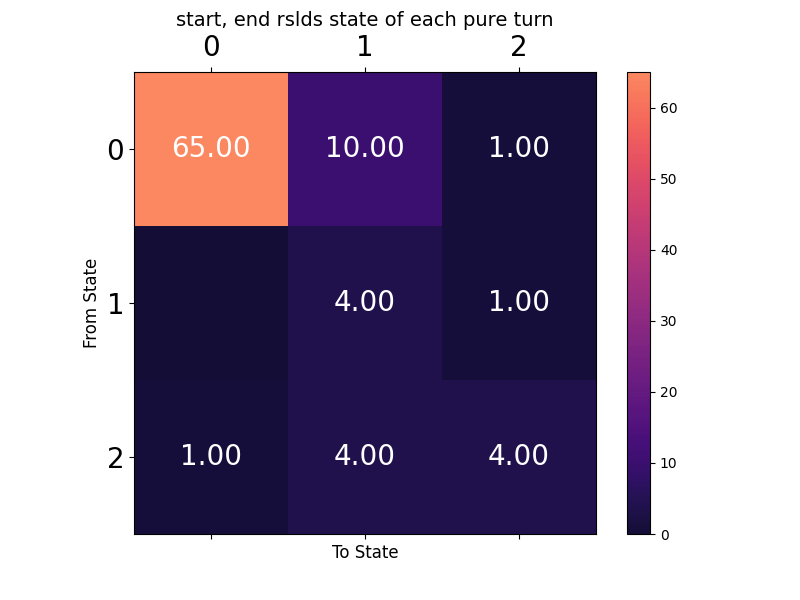

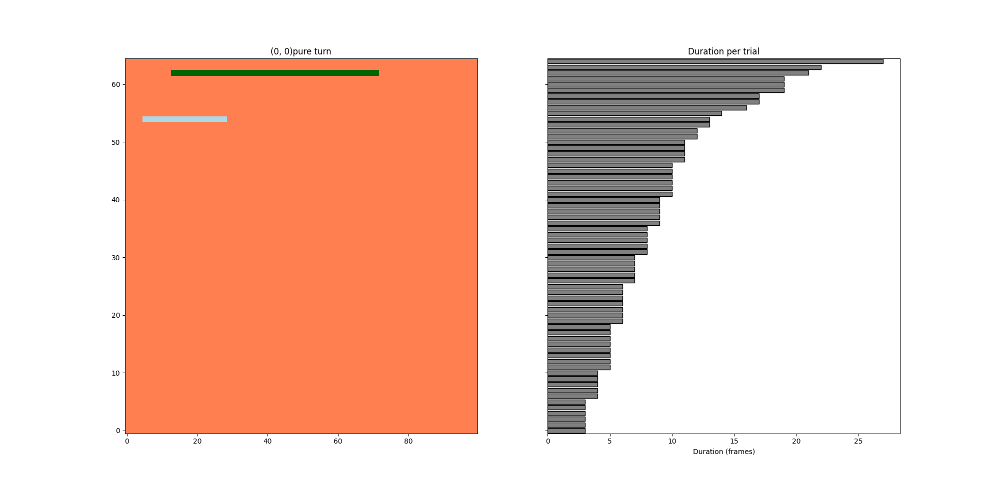

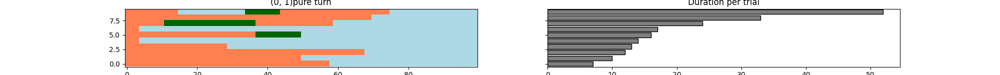

SystemError: tile cannot extend outside image

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous view', 'arrow-left', 'back'), ('Forward', 'Forward to next view', 'arrow-right', 'forward'), ('Pan', 'Left button pans, Right button zooms\nx/y fixes axis, CTRL fixes aspect', 'arrows', 'pan'), ('Zoom', 'Zoom to rectangle\nx/y fixes axis', 'square-o', 'zoom'), ('Download', 'Download plot', 'floppy-o', 'save_figure')]))

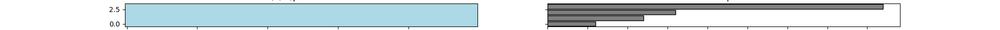

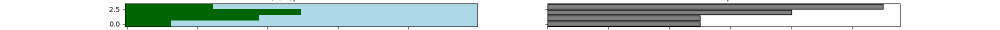

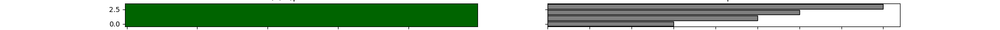

In [17]:
    
motor_state_to_feature_rslds_state_to_feature_vals = {}
motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is = {}
for motor_state in [3,4,5,6]:#[0,1,2]:
    
    rslds_state_to_exp_date_to_beh_start_end_is =  get_motor_state_start_end_is_rslds_start_end_specific(motor_state, exp_dates, beh_list, q_z,  rslds_states = [0,1,2])
    motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is[motor_state] = rslds_state_to_exp_date_to_beh_start_end_is

for motor_state in [3,4,5,6]: 
    rslds_state_to_exp_date_to_beh_start_end_is = motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is[motor_state]
    
    counts = np.zeros((n_rslds_states+1, n_rslds_states+1))
    for (rslds_start_state, rslds_end_state) in rslds_state_to_exp_date_to_beh_start_end_is.keys():
        for date, (starts, ends) in rslds_state_to_exp_date_to_beh_start_end_is[(rslds_start_state, rslds_end_state)].items():
            counts[rslds_start_state, rslds_end_state]+= starts.shape[0]
    
    visualize_transition_matrix(counts, title = f"start, end rslds state of each {motor_state_num_to_name[motor_state]}",  labels=None)       
    
    for rslds_start_state, rslds_end_state in rslds_state_to_exp_date_to_beh_start_end_is.keys():

        date_to_beh_start_ends = rslds_state_to_exp_date_to_beh_start_end_is[(rslds_start_state, rslds_end_state)] 
        # fig,axs = plt.subplots(1,2, sharey = True)
        n_rows = counts[rslds_start_state, rslds_end_state]
        n_cols = 100
        figsize = (n_cols * col_width*2, n_rows * row_height)
        max_height = 12  # in inches
        fig_height = min(n_rows * row_height, max_height)
        fig, axs = plt.subplots(1,2, figsize=figsize, sharey = True)
        figsize = (n_cols * col_width * 2, fig_height)

        # fig, ax = plt.subplots()
        # axs = [ax]
       
        # n_tracks = 100 
        rslds_clips = []
        durations = []
        for i, date in enumerate(exp_dates):
            beh_starts, beh_ends = date_to_beh_start_ends[date]
            rslds_seq = q_z[i]
            for start, end in zip(beh_starts, beh_ends):
                duration = end-start
                if duration ==1: 
                    continue
                durations.append(duration)
                rslds_clip = rslds_seq[start:end]
                rslds_clip_normalized =  interpolates_discrete(rslds_clip, n_target = 100 )###but interpoalte into discret states--can make longer or?
                rslds_clips.append(rslds_clip_normalized.astype('int'))
        if len(rslds_clips) ==0: 
            continue
        rslds_clips = np.array(rslds_clips)
        durations = np.array(durations)
        print(np.unique(rslds_clips))
        sort_i = np.argsort(durations)
        rslds_clips = rslds_clips[sort_i]
        durations = durations[sort_i]


        ax = axs[0]
        axs[0].imshow(np.array(rslds_clips), cmap = cmap,vmin=0, vmax=len(palette)-1,  aspect='auto')
        ax.set_title(f"{rslds_start_state, rslds_end_state }{motor_state_num_to_name[motor_state]}")
        
        ax1 = axs[1]
        # Plot the durations as a horizontal bar plot
        y_pos = np.arange(len(durations))  # One bar per row/trial
        ax1.barh(y_pos, durations, color='gray', edgecolor='k')
        ax1.set_ylim(ax.get_ylim())  # Align y-axis with the heatmap
        ax1.invert_yaxis()  # Match imshow orientation (top = 0)
        ax1.set_xlabel("Duration (frames)")
        ax1.set_title("Duration per trial")

        # plt.tight_layout()

motorstate 0
motorstate 0 (0, 0) 138
motorstate 0 (0, 1) 331
motorstate 0 (0, 2) 10
motorstate 0 (1, 0) 6
motorstate 0 (1, 1) 85
motorstate 0 (1, 2) 0
motorstate 0 (2, 0) 88
motorstate 0 (2, 1) 159
motorstate 0 (2, 2) 76
motorstate 1
motorstate 1 (0, 0) 95
motorstate 1 (0, 1) 9
motorstate 1 (0, 2) 12
motorstate 1 (1, 0) 112
motorstate 1 (1, 1) 163
motorstate 1 (1, 2) 413
motorstate 1 (2, 0) 4
motorstate 1 (2, 1) 9
motorstate 1 (2, 2) 88
motorstate 2
motorstate 2 (0, 0) 85
motorstate 2 (0, 1) 15
motorstate 2 (0, 2) 4
motorstate 2 (1, 0) 8
motorstate 2 (1, 1) 25
motorstate 2 (1, 2) 12
motorstate 2 (2, 0) 125
motorstate 2 (2, 1) 45
motorstate 2 (2, 2) 33
[(0, 0), (0, 1), (0, 2), (1, 0), (1, 1), (1, 2), (2, 0), (2, 1), (2, 2)]
(0, 0) 138
skipping,  (0, 2) 10
skipping,  (1, 0) 6
skipping,  (1, 2) 0
(0, 1) 331
skipping,  (0, 2) 10
skipping,  (1, 0) 6
skipping,  (1, 2) 0
(1, 1) 85
skipping,  (0, 2) 10
skipping,  (1, 0) 6
skipping,  (1, 2) 0
(2, 0) 88
skipping,  (0, 2) 10
skipping,  (1, 0) 6
s

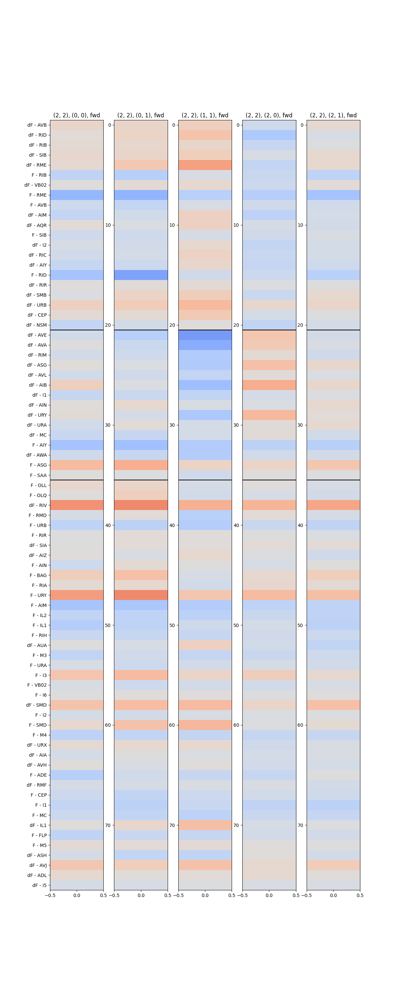

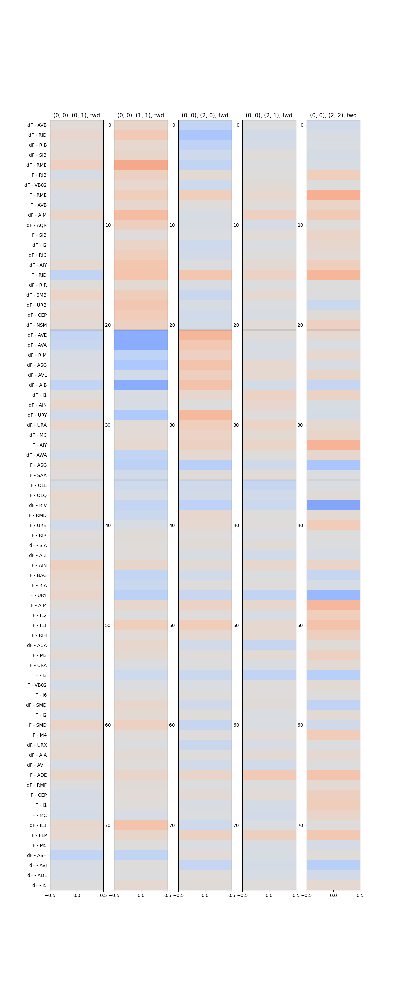

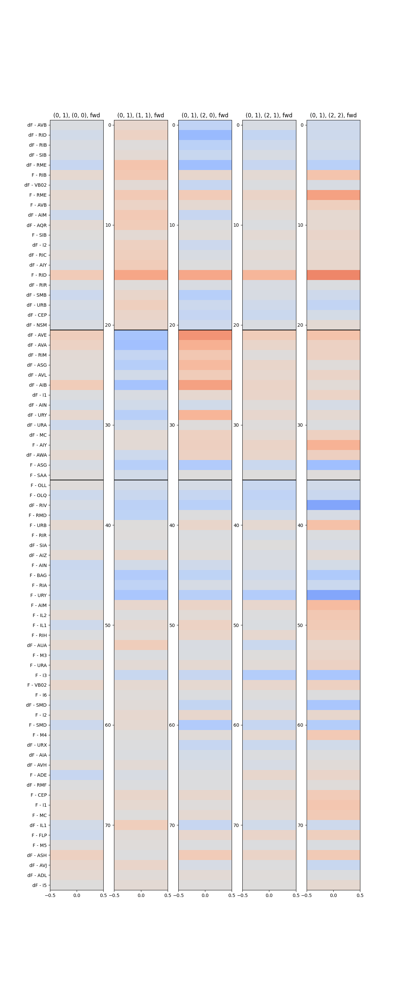

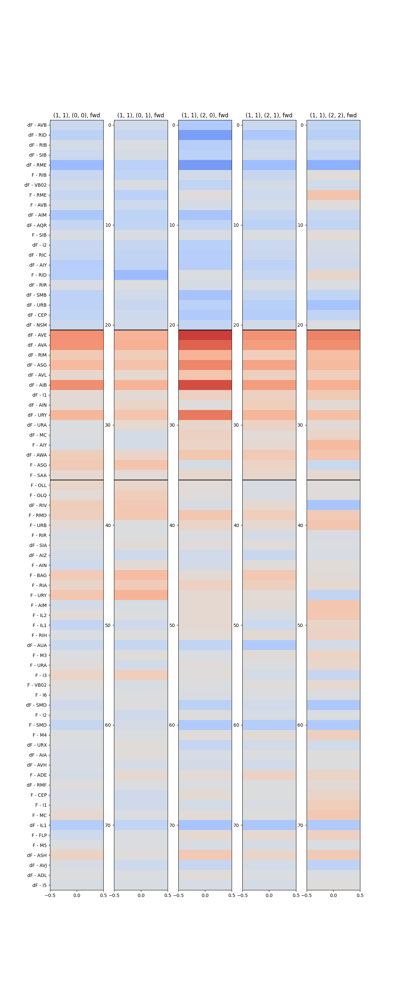

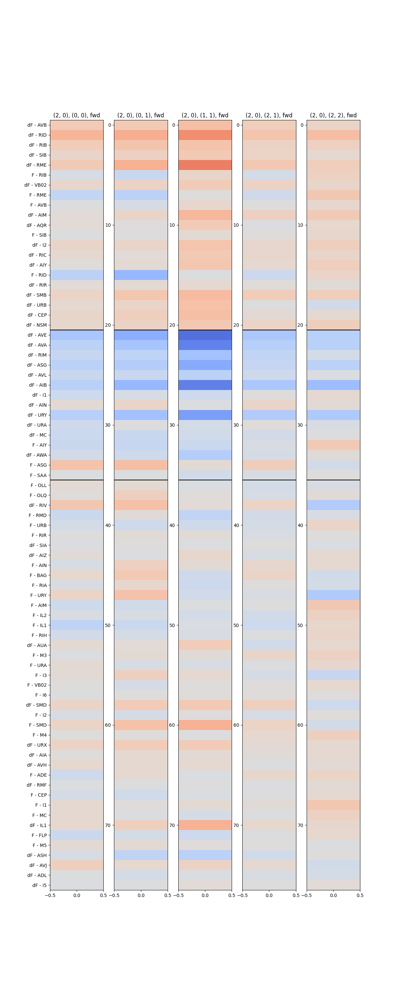

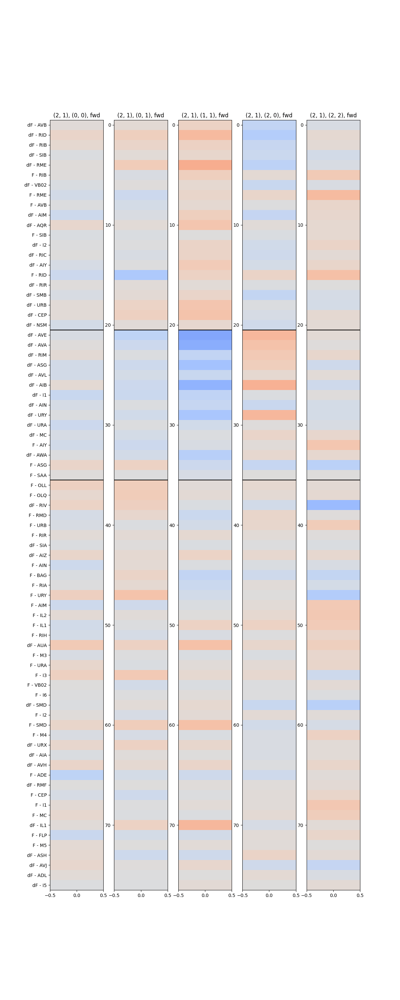

In [18]:
def get_pair_wise_avgs(pair1_vals, pair2_vals, max_comparisons = 1000, random_state=None):
    rng = np.random.default_rng(random_state)
    # n_samples = min(len(pair1_vals), len(pair2_vals))
    # n_samples = min(n_samples, max_comparisons)
    n_samples = 1000
    idx1 = rng.integers(0, len(pair1_vals), size=n_samples)
    idx2 = rng.integers(0, len(pair2_vals), size=n_samples)

    diffs = pair1_vals[idx1] - pair2_vals[idx2]

    return diffs


def plot_neural_activity_heatmap(columns, neural_labels_all, col_titles, neural_labels_to_plot = None, border_neurons = None):
    
    if neural_labels_to_plot is None: 
        neural_labels_to_plot  = neural_labels_all
    neural_labels_to_plot = np.array(neural_labels_to_plot)
    indices = [np.where(neural_labels_all == val)[0][0] for val in neural_labels_to_plot]
    
    
    
    columns = np.array(columns)
    n_rows, n_cols = columns.shape
    fig, axs = plt.subplots( 1, n_cols ,figsize=(12, 30))
    
    
    for i in range(n_cols):
        col, title = columns[:, i], col_titles[i]
        axs[i].imshow(col[indices][:,None], aspect="auto", cmap="coolwarm", vmin = -2, vmax=2)
        axs[i].set_title(title)
    

    ax = axs[0]
    ax.set_yticks(np.arange(len(neural_labels_to_plot)), labels=neural_labels_to_plot, #rotation = 45, 
                  fontsize=10);
    

    if border_neurons is not None:
            for neuron in border_neurons: 
                i = np.argwhere(neural_labels_to_plot == neuron)[0]
                for ax in axs: 
                    ax.axhline(i-0.5, color = "black")
    


motor_state_to_feature_rslds_state_to_feature_vals = {}
motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is = {}
motor_states = [0,1,2]
for motor_state in motor_states:#[0,1,2]:
    
    
    rslds_state_to_exp_date_to_beh_start_end_is =  get_motor_state_start_end_is_rslds_start_end_specific(motor_state, exp_dates, z, q_z,  rslds_states = [0,1,2])
    motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is[motor_state] = rslds_state_to_exp_date_to_beh_start_end_is
    
    
    
Y = np.array(Y)
motor_state_to_pair_to_neural_activities = {}
motor_state_to_pair_to_neural_activity_means = {}
motor_state_to_pair_to_neural_activity_maxs = {}
motor_state_to_pair_to_neural_activity_mins = {}
# motor_states = [0]
for motor_state in motor_states: 
    print("motorstate", motor_state)
    
    motor_state_to_pair_to_neural_activities[motor_state] = {}
    motor_state_to_pair_to_neural_activity_means[motor_state] =  {}
    motor_state_to_pair_to_neural_activity_maxs[motor_state] =  {}
    motor_state_to_pair_to_neural_activity_mins[motor_state] =  {}
    # for rslds_start_state, rsdls_end_state in pairs:
    for rslds_start_state, rslds_end_state in motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is[motor_state].keys():
        n_frames = 0
        motor_state_to_pair_to_neural_activities[motor_state][(rslds_start_state, rslds_end_state)] =[]
        motor_state_to_pair_to_neural_activity_means[motor_state][(rslds_start_state, rslds_end_state)] =[]
        motor_state_to_pair_to_neural_activity_maxs[motor_state][(rslds_start_state, rslds_end_state)] =[]
        motor_state_to_pair_to_neural_activity_mins[motor_state][(rslds_start_state, rslds_end_state)] =[]

        for i, date in enumerate(exp_dates):
            beh_starts, beh_ends = motor_state_to_rslds_state_to_exp_date_to_beh_start_end_is[motor_state][(rslds_start_state, rslds_end_state)][date]
            durations = beh_ends-beh_starts
            beh_starts = beh_starts[durations>1]
            beh_ends = beh_ends[durations>1]
            n_frames+=len(beh_starts)
            # print(len(beh_starts))
            rslds_seq = q_z[i]
            for start, end in zip(beh_starts, beh_ends):
                neuralseq = Y[i, start:end, : ]
                
                motor_state_to_pair_to_neural_activities[motor_state][(rslds_start_state, rslds_end_state)].append(neuralseq)#date; time ; n neurons 
                motor_state_to_pair_to_neural_activity_means[motor_state][(rslds_start_state, rslds_end_state)].append(np.nanmean(neuralseq, axis = 0))
                motor_state_to_pair_to_neural_activity_maxs[motor_state][(rslds_start_state, rslds_end_state)].append(np.nanmin(neuralseq, axis = 0))     
                motor_state_to_pair_to_neural_activity_mins[motor_state][(rslds_start_state, rslds_end_state)].append(np.nanmax(neuralseq, axis = 0))     
        print("motorstate", motor_state, (rslds_start_state, rslds_end_state) , n_frames)
import os
contributor_thres = 0.05
foldername = "/Users/friederikebuck/Downloads/worm notes/processed_checkpts/test_rslds_QM_run_061325/model_selection/top_2_combined/"
with open(os.path.join(foldername, f'high_contributing_neurons_rslds_{contributor_thres}.txt')) as f:
    neural_labels_cropped = [line.strip() for line in f]
    
###get avg of pairwise differences 
motor_state = 0  
pair_to_vals_dict = motor_state_to_pair_to_neural_activity_means[motor_state]
pairs = list(pair_to_vals_dict.keys())
print(pairs)

for i in range(len(pairs)):
    
    pair1 = pairs[i]
    pair1_vals = np.array(motor_state_to_pair_to_neural_activity_means[motor_state][pair1])
    n_pair1_instances = len(pair1_vals)
    if n_pair1_instances<15:
        continue
    print(pair1 , n_pair1_instances)
    pair_specific_mean_diffs = []

    col_titles = []

    for j in range(len(pairs)):
        # ax = axs[k]
        if i ==j:
            continue
        pair2 =  pairs[j]
        pair2_vals = np.array(motor_state_to_pair_to_neural_activity_means[motor_state][pair2])
        n_pair2_instances = len(pair2_vals)
        if n_pair2_instances<15:
            print("skipping, ", pair2, n_pair2_instances)
            continue
        diffs  = get_pair_wise_avgs(pair1_vals, pair2_vals, max_comparisons = 1000, random_state=None)
        mean_diffs = np.nanmean(diffs, axis = 0 )[:, None]
        ##plot heat map of diffs with neaul activity as labels 
       
        # im = ax.imshow(mean_diffs, aspect="auto", cmap="coolwarm", vmin = -0.3, vmax=0.3)
        pair_specific_mean_diffs.append(mean_diffs)
        col_titles.append(f"{pair1}, {pair2}, {motor_state_num_to_name[motor_state]}")

    pair_specific_mean_diffs = np.concatenate(pair_specific_mean_diffs, axis = 1)
    plot_neural_activity_heatmap(pair_specific_mean_diffs, neural_labels, col_titles, neural_labels_to_plot = neural_labels_cropped, border_neurons = ['dF - AVE'
, "dF - AVE", "F - OLL"])

    
    
plt.show()
###get difference between overall avgs 





##later.. get infleciton differentces -- like counts of inflections that happen in a time bin but not in in a different time bin normalize by n counts?

        

(1599, 9)
AX is NOT none
overlap [[480.  61.  38.]
 [ 10. 384. 204.]
 [257.  80.  85.]]


/var/folders/8z/xy4sl8b90qnc_x9p_4psrnmh0000gn/T/ipykernel_16864/3413066556.py:139: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  '-', color=colors[z[cp_start]],


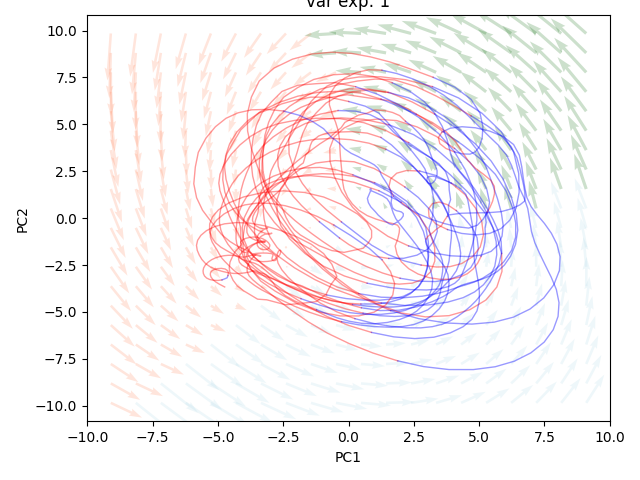

In [19]:
###plot in PC space - gray lines; color beh types 

from matplotlib.colors import LinearSegmentedColormap
import numpy as np
import matplotlib.pyplot as plt
# import matplotlib
# # %matplotlib widget
# import pickle
# import matplotlib.gridspec as gridspec
import ssm 
from sklearn.decomposition import PCA
# from scipy.cluster.hierarchy import linkage, leaves_list, dendrogram, fcluster
# import seaborn as sns
# import ipywidgets as widgets
# from IPython.display import display
# from ipywidgets import interact, IntSlider
import sys
import glob
sys.path.append("/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/")
sys.path.append('/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/')
sys.path.append("/ru-auth/local/home/fbuck/scratch/test_rslds_params/")
sys.path.append("/Users/friederikebuck/")
sys.path.append("/ru-auth/local/home/fbuck/scratch/test_rslds_params/")
sys.path.append("/ru-auth/local/home/fbuck/scratch/test_rslds_params/WholeBrainImagingAnalysis/")

# from scipy.ndimage import gaussian_filter1d
# from get_data.read_neuro_beh_data import get_exp_features
# from get_data.process_neural_data import get_derivative_of_neural_activity, get_neural_activity_from_labels, get_neural_activity_and_labels
# from beh_classification.behavior_features import get_behavior_features
# from beh_classification.get_behavior_classifications import get_behavior_classification
# from beh_classification.beh_classification_utils import get_start_end_is_of_ones_in_binary_array
# import socket
# import sklearn
# from sklearn.cross_decomposition import CCA
# from sklearn.utils import shuffle
# import os
# import copy

#color palette for plotting, colors as in make_behavior_ethogram
palette = ["coral",     # forward
           "lightblue", # reverse
           "darkgreen", # turn
           "purple","red", "yellow", "black", "pink", "grey", "cyan"]    # pause
cmap = LinearSegmentedColormap.from_list("behavior", palette, N=len(palette))



def states_to_changepoints(z):
    assert z.ndim == 1
    z = np.array(z)
    return np.concatenate(([0], 1 + np.where(np.diff(z))[0], [z.size - 1]))
def plot_dynamics(model, q_x, q_z, z_w, continuous_dynamics_states,
                  emissions_dim, 
                  n_disc_states=3, 
                  colors = palette,
                  quiver_alpha = 0.3, 
                  transition = "recurrent_only",
                    #transition = "sticky_recurrent_only"
                    dynamic = "diagonal_gaussian",
                    emission = "gaussian_orthog",
                    fig = None, 
                    ax = None

                  ):
        #phase portraits
        pca = PCA() 
        pca_x = pca.fit_transform(q_x) #do pca
        print(pca_x.shape)
        id1=0 #choose which 2 PCs you want to plot
        id2=1
        W = pca.components_[[id1,id2],:]  # get components


        # Create the PCA-space rslds model and initialize its parameters
        # This is done so we can feed it into to scotts handy plot_most_likely_dynamics function
        pca_slds = ssm.SLDS(emissions_dim, n_disc_states, 2,
                        transitions=transition,
                        dynamics=dynamic,
                        emissions=emission,
                        single_subspace=True)


        #plot the phase portraits in PCA world
        for k in range(n_disc_states):
            # Dimensionality-reduced versions of A and b
            A_reduced = W @ model.dynamics.As[k] @ W.T
            b_reduced = W @ model.dynamics.bs[k]
            R_reduced = W @ model.transitions.Rs[k]
            pca_slds.dynamics.As[k] = A_reduced
            pca_slds.dynamics.bs[k] = b_reduced
            pca_slds.transitions.Rs[k] = R_reduced
            pca_slds.transitions.r[k] = model.transitions.r[k]

        if True:
            if ax is None: 
                print("AX is none")
                fig, ax = plt.subplots(1,1, figsize=(8,6))
            else: 
                print("AX is NOT none")
            
            # plot_2d_continuous_states(pca_x, q_z, ax=ax, inds=(id1, id2), lw=1, alpha=0.4)
            plot_2d_continuous_states(pca_x, continuous_dynamics_states, ax=ax, inds=(id1, id2), lw=1, alpha=0.4, colors=colors,
                              )

            lim = abs(pca_x).max(axis=0) + 1
            try:
                pca_slds.permute(find_permutation(z_w, q_z))
            except:
                pass
            plot_most_likely_dynamics(pca_slds, 
                                      xlim=(-lim[0], lim[0]), ylim=(-lim[1], lim[1]), 
                                      
                                      
                                      ax=ax, alpha=quiver_alpha)
            ax.set_title("var exp: {}".format(1+id1, 1+id2,sum(pca.explained_variance_ratio_[[id1,id2]])))
            ax.set_xlabel("PC1")
            ax.set_ylabel("PC2")
        return fig, ax
def plot_2d_continuous_states(x, z,
                              colors=palette,
                              
                              
                              
                              ax=None,
                              inds=(0,1),
                              figsize=(2.5, 2.5),
                              **kwargs):

    if ax is None:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111)

    cps = states_to_changepoints(z)

    # Color denotes our inferred latent discrete state
    for cp_start, cp_stop in zip(cps[:-1], cps[1:]):
        ax.plot(x[cp_start:cp_stop + 1, inds[0]],
                x[cp_start:cp_stop + 1, inds[1]],
                 '-', color=colors[z[cp_start]],
                **kwargs)

def plot_most_likely_dynamics(model,
    xlim=(-4, 4), ylim=(-3, 3), nxpts=20, nypts=20,
    alpha=0.3, ax=None, figsize=(3, 3), color=None, ):
    
    K = model.K
    assert model.D == 2
    x = np.linspace(*xlim, nxpts)
    y = np.linspace(*ylim, nypts)
    X, Y = np.meshgrid(x, y)
    xy = np.column_stack((X.ravel(), Y.ravel()))

    # Get the probability of each state at each xy location
    try:
        z = np.argmax(xy.dot(model.transitions.Rs.T) + model.transitions.r, axis=1)
    except:
        z = np.argmax(xy.dot(model.transitions.Rs.T), axis=1)

    if ax is None:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111)

    for k, (A, b) in enumerate(zip(model.dynamics.As, model.dynamics.bs)):
        dxydt_m = xy.dot(A.T) + b - xy

        zk = z == k
        if zk.sum(0) > 0:
            if color == None:
                ax.quiver(xy[zk, 0], xy[zk, 1],
                        dxydt_m[zk, 0], dxydt_m[zk, 1],
                        color=palette[k % len(palette)], alpha=alpha)
            else:
                ax.quiver(xy[zk, 0], xy[zk, 1],
                        dxydt_m[zk, 0], dxydt_m[zk, 1],
                        color=color, alpha=alpha)

    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')

    plt.tight_layout()

    return ax


def plot_dynamic_landscape(model,k,
    xlim=(-4, 4), ylim=(-3, 3), nxpts=20, nypts=20,
    alpha=0.3, ax=None, figsize=(3, 3), color=None):
    assert model.D == 2
    K = model.K
    x = np.linspace(*xlim, nxpts)
    y = np.linspace(*ylim, nypts)
    X, Y = np.meshgrid(x, y)
    xy = np.column_stack((X.ravel(), Y.ravel()))

    # Get the probability of each state at each xy location
    try:
        z = np.argmax(xy.dot(model.transitions.Rs.T) + model.transitions.r, axis=1)
    except:
        z = np.argmax(xy.dot(model.transitions.Rs.T), axis=1)

    if ax is None:
        fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

    dxydt_m = xy.dot(model.dynamics.As[k].T) + model.dynamics.bs[k] - xy
    dxydt_m_norm = np.zeros((len(dxydt_m)))
    for xt in range(len(dxydt_m_norm)):
        dxydt_m_norm[xt] = np.linalg.norm(dxydt_m[xt,:])

    ax.plot_trisurf(xy[:,0], xy[:,1], dxydt_m_norm, cmap = "coolwarm", linewidth=0, antialiased=False)

    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')

    plt.tight_layout()

    return ax

def plot_most_likely_dynamics_new(model, test_x, test_z, pca_x, pc3 = 0, input_str=0, input_id=0, ax=None, lim = None, plot_trajectory=True, inds=(0,1), do_pca=True, velocity=False):
    ind1,ind2 = inds
    pca = PCA(n_components=pca_x.shape[1])
    x_centered = pca_x - np.mean(pca_x, axis=0)
    pca.fit(x_centered)  # X is your trajectory data matrix
    X_pca = pca.transform(test_x - np.mean(pca_x, axis=0) )
    
    K = model.K
    # Define grid limits based on PCA-transformed trajectory
    if lim == None:
        x_min, x_max = X_pca[:, ind1].min() - 3, X_pca[:, ind1].max() + 3
        y_min, y_max = X_pca[:, ind2].min() - 3, X_pca[:, ind2].max() + 3
        lim = [x_min, x_max, y_min, y_max]
    else:
        x_min = lim[0]
        x_max = lim[1]
        y_min = lim[2]
        y_max = lim[3]

    # Create a grid of points
    x = np.linspace(x_min, x_max, 30)  # 30 grid points along x-axis
    y = np.linspace(y_min, y_max, 30)  # 30 grid points along y-axis
    X_grid, Y_grid = np.meshgrid(x, y)  # Create the grid

    # Inverse transform to get high-dimensional coordinates of grid points
    xy = np.column_stack(pca_x.shape[1]*[0*Y_grid.ravel()])
    xy[:,ind1] = X_grid.ravel()
    xy[:,ind2] = Y_grid.ravel()

    if do_pca:
        xy_high_dim = pca.inverse_transform(xy)  # Map back to original space
    else:
        xy_high_dim = xy

    # Get the probability of each state at each xy location
    try:
        z = np.argmax(xy_high_dim.dot(model.transitions.Rs.T) + model.transitions.r, axis=1)
    except:
        z = np.argmax(xy_high_dim.dot(model.transitions.Rs.T), axis=1)

    if ax is None:
        fig = plt.figure()
        ax = fig.add_subplot(111)

    velocity_magnitudes = np.zeros_like(X_grid.ravel())

    if model.M == 0:
        for k, (A, b) in enumerate(zip(model.dynamics.As, model.dynamics.bs)):
            next_step_high_dim = xy_high_dim @ A.T + b  # x_t+1 = Ax_t + b
            # Map back to PCA space for visualization
            if do_pca:
                next_step_pca = next_step_high_dim @ pca.components_.T
            else:
                next_step_pca = next_step_high_dim

            zk = z == k
            if zk.sum(0) > 0:
                ax.quiver(xy[zk, ind1], xy[zk, ind2],
                        next_step_pca[zk, ind1]-xy[zk,ind1], next_step_pca[zk, ind2]-xy[zk,ind2],
                        color=palette[k % len(palette)], alpha=1)
            velocity_magnitudes[zk] = np.linalg.norm(next_step_pca[zk] - xy[zk], axis=1)
    else:
        for k, (A, b, V) in enumerate(zip(model.dynamics.As, model.dynamics.bs, model.dynamics.Vs)):
            next_step_high_dim = xy_high_dim @ A.T + b + input_str*V[:,input_id] # x_t+1 = Ax_t + b
            # Map back to PCA space for visualization
            if do_pca:
                next_step_pca = next_step_high_dim @ pca.components_.T
            else:
                next_step_pca = next_step_high_dim

            zk = z == k
            if zk.sum(0) > 0:
                ax.quiver(xy[zk, ind1], xy[zk, ind2],
                        next_step_pca[zk, ind1]-xy[zk,ind1], next_step_pca[zk, ind2]-xy[zk,ind2],
                        color=palette[k % len(palette)], alpha=1)
                velocity_magnitudes[zk] = np.linalg.norm(next_step_pca[zk] - xy[zk], axis=1)
            
    if velocity:
        ax.cla()
         # Reshape velocity magnitudes to match grid
        velocity_magnitudes = velocity_magnitudes.reshape(30, 30)

        if ax is None:
            fig, ax = plt.subplots(figsize=(6, 6))

        # Plot the velocity heatmap
        heatmap = ax.pcolormesh(X_grid, Y_grid, velocity_magnitudes, cmap="Purples", shading='auto')
        plt.colorbar(heatmap, ax=ax, label="Velocity Magnitude")
                
    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')

    plt.tight_layout()
    if plot_trajectory:
        if do_pca:
            plot_2d_continuous_states(X_pca, test_z, ax=ax, inds=inds)
        else:
            plot_2d_continuous_states(test_x, test_z, ax=ax, inds=inds)
    ax.set_xlim(x_min+2, x_max-2)
    ax.set_ylim(y_min+2, y_max-2)

    return ax, lim




def plot_most_likely_dynamics_new(model, test_x, test_z, pca_x, pc3 = 0, input_str=0, input_id=0, ax=None, lim = None, plot_trajectory=True, inds=(0,1), do_pca=True, velocity=False):
    ind1,ind2 = inds
    pca = PCA(n_components=pca_x.shape[1])
    x_centered = pca_x - np.mean(pca_x, axis=0)
    pca.fit(x_centered)  # X is your trajectory data matrix
    X_pca = pca.transform(test_x - np.mean(pca_x, axis=0) )
    
    K = model.K
    # Define grid limits based on PCA-transformed trajectory
    if lim == None:
        x_min, x_max = X_pca[:, ind1].min() - 3, X_pca[:, ind1].max() + 3
        y_min, y_max = X_pca[:, ind2].min() - 3, X_pca[:, ind2].max() + 3
        lim = [x_min, x_max, y_min, y_max]
    else:
        x_min = lim[0]
        x_max = lim[1]
        y_min = lim[2]
        y_max = lim[3]

    # Create a grid of points
    x = np.linspace(x_min, x_max, 30)  # 30 grid points along x-axis
    y = np.linspace(y_min, y_max, 30)  # 30 grid points along y-axis
    X_grid, Y_grid = np.meshgrid(x, y)  # Create the grid

    # Inverse transform to get high-dimensional coordinates of grid points
    xy = np.column_stack(pca_x.shape[1]*[0*Y_grid.ravel()])
    xy[:,ind1] = X_grid.ravel()
    xy[:,ind2] = Y_grid.ravel()

    if do_pca:
        xy_high_dim = pca.inverse_transform(xy)  # Map back to original space
    else:
        xy_high_dim = xy

    # Get the probability of each state at each xy location
    try:
        z = np.argmax(xy_high_dim.dot(model.transitions.Rs.T) + model.transitions.r, axis=1)
    except:
        z = np.argmax(xy_high_dim.dot(model.transitions.Rs.T), axis=1)

    if ax is None:
        fig = plt.figure()
        ax = fig.add_subplot(111)

    velocity_magnitudes = np.zeros_like(X_grid.ravel())

    if model.M == 0:
        for k, (A, b) in enumerate(zip(model.dynamics.As, model.dynamics.bs)):
            next_step_high_dim = xy_high_dim @ A.T + b  # x_t+1 = Ax_t + b
            # Map back to PCA space for visualization
            if do_pca:
                next_step_pca = next_step_high_dim @ pca.components_.T
            else:
                next_step_pca = next_step_high_dim

            zk = z == k
            if zk.sum(0) > 0:
                ax.quiver(xy[zk, ind1], xy[zk, ind2],
                        next_step_pca[zk, ind1]-xy[zk,ind1], next_step_pca[zk, ind2]-xy[zk,ind2],
                        color=palette[k % len(palette)], alpha=1)
            velocity_magnitudes[zk] = np.linalg.norm(next_step_pca[zk] - xy[zk], axis=1)
    else:
        for k, (A, b, V) in enumerate(zip(model.dynamics.As, model.dynamics.bs, model.dynamics.Vs)):
            next_step_high_dim = xy_high_dim @ A.T + b + input_str*V[:,input_id] # x_t+1 = Ax_t + b
            # Map back to PCA space for visualization
            if do_pca:
                next_step_pca = next_step_high_dim @ pca.components_.T
            else:
                next_step_pca = next_step_high_dim

            zk = z == k
            if zk.sum(0) > 0:
                ax.quiver(xy[zk, ind1], xy[zk, ind2],
                        next_step_pca[zk, ind1]-xy[zk,ind1], next_step_pca[zk, ind2]-xy[zk,ind2],
                        color=palette[k % len(palette)], alpha=1)
                velocity_magnitudes[zk] = np.linalg.norm(next_step_pca[zk] - xy[zk], axis=1)
            
    if velocity:
        ax.cla()
         # Reshape velocity magnitudes to match grid
        velocity_magnitudes = velocity_magnitudes.reshape(30, 30)

        if ax is None:
            fig, ax = plt.subplots(figsize=(6, 6))

        # Plot the velocity heatmap
        heatmap = ax.pcolormesh(X_grid, Y_grid, velocity_magnitudes, cmap="Purples", shading='auto')
        plt.colorbar(heatmap, ax=ax, label="Velocity Magnitude")
                
    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')

    plt.tight_layout()
    if plot_trajectory:
        if do_pca:
            plot_2d_continuous_states(X_pca, test_z, ax=ax, inds=inds)
        else:
            plot_2d_continuous_states(test_x, test_z, ax=ax, inds=inds)
    ax.set_xlim(x_min+2, x_max-2)
    ax.set_ylim(y_min+2, y_max-2)

    return ax, lim
def get_bin_mat_from_start_end_is():
    pass

emissions_dim = Y.shape[1]
model = slds
continuous_state_colors = ["red", "blue"]

for exp_i, (date, z_w, q_z_w, q_x_w, labels, traces) in [list(enumerate(zip(exp_dates, z, q_z, q_x, neural_labels, Y)))[0]]:#(len(z)):
    fig, ax = plt.subplots()
    continuous_dynamics_states = z_w==1 #get_bin_mat_from_start_end_is()
    plot_dynamics(model, q_x_w, q_z_w, z_w, continuous_dynamics_states,
            emissions_dim, 
            n_disc_states=3, 
            transition = "recurrent_only",
            #transition = "sticky_recurrent_only"
            dynamic = "diagonal_gaussian",
            emission = "gaussian_orthog",
            colors = continuous_state_colors,
            quiver_alpha = 0.2,
            fig = fig, 
            ax = ax
            )


full_neural_labels

NameError: name 'date_to_discrete_rslds_states' is not defined

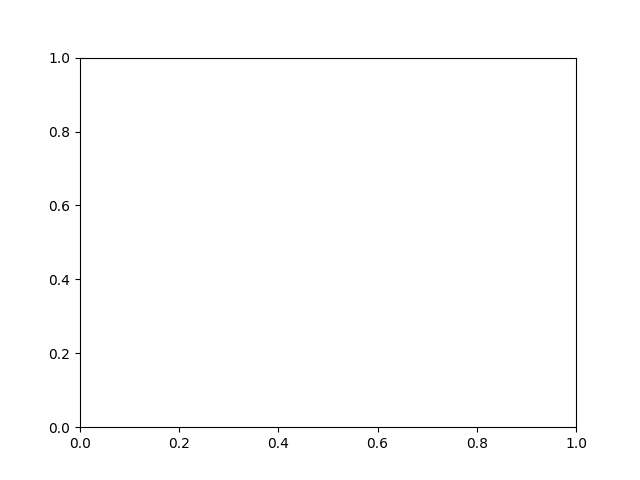

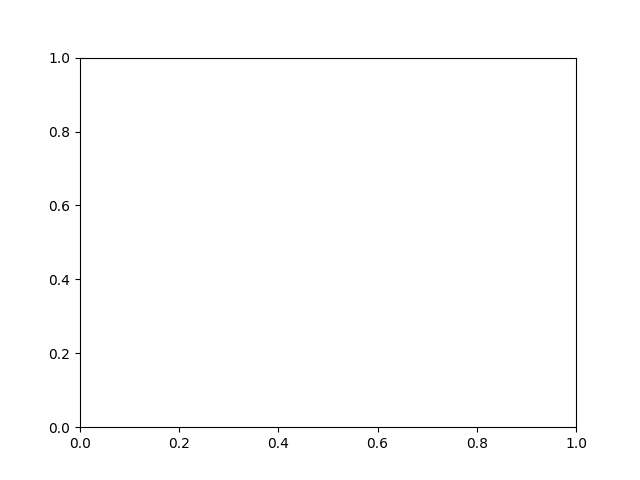

In [20]:


# for rslds_start_state, rslds_end_state in rslds_pairs:
fig, ax = plt.subplots() 
cdf_fig, cdf_ax = plt.subplots() 

rslds_start_states= [0,1]
rslds_state_to_duration = {state: {} for state in rslds_start_states}

for rslds_start_state in  rslds_start_states: 
    '''get number of reversals that: 
        - start in rslds state and end in other rslds state 
        - start in rslds state and stay in rslds state 
        - start in differnt state and end in rslds state 
    ...based on this decide which version to plot.. 
    '''
    # fig, ax = plt.subplots()
    feature_vals = []
    beh_states = []
    for exp_date in exp_dates:#_to_feature.items():
        
        rsldsseq = date_to_discrete_rslds_states[exp_date]
        behseq = exp_date_to_beh[exp_date]
        # featureseq = exp_date_to_feature[exp_date]
        state_starts, state_ends = get_state_start_ends(rev_state , behseq,  starts= None, ends = None)
        
        rsldsseq = exp_date_to_rslds_states[exp_date]
        
        rev_starts, rev_ends = get_state_start_ends(rev_state , behseq,  starts= None, ends = None)
        
        
        '''get where start in rslds state '''
        # rev_is = np.argwhere(np.logical_and(rslds_start_state==rsldsseq[rev_starts]
        #                         , 
        #                         rslds_end_state==rsldsseq[rev_ends-1]
                                
        #                         )
        #                     ).flatten()
        rev_is = np.argwhere(rslds_start_state==rsldsseq[rev_starts]
                    ).flatten()

        for start, end in zip(rev_starts[rev_is], rev_ends[rev_is]):
            beh_states.append(np.all(behseq[start:end]))
            feature_vals.append((end - start)*0.6/time_bin)
    # print("np.all(beh_states)", np.all(beh_states))
    
    plot_probabilities_hist(np.array(feature_vals), bins= feature_to_dict["duration (s)"]["bins"], color = rslds_state_to_color[rslds_start_state], 
                                alpha = 0.5, label =rslds_state_to_label[rslds_start_state],
                            fig = fig, ax = ax, 
                            # ylim = None
                            )
    
    rslds_state_to_duration[rslds_start_state] = np.array(feature_vals)
    # plot_cdf(cdf_ax, np.array(feature_vals),  rslds_state_to_color[rslds_start_state], rslds_state_to_label[rslds_start_state],bins = bins,  ylim = [0,1.1], alpha = 0.7, linewidth=2 )
    
ax.set_title(f"duration of reversals given rslds starting state")
ax.set_xlabel("seconds (s)")
ax.legend()


cdf_ax.set_title(f"duration of reversals given rslds starting state")
cdf_ax.set_xlabel("seconds (s)")
cdf_ax.legend()


# fig1, ax1
plot_hist_across_conditins_and_get_KS_stats(rslds_state_to_duration,  rslds_state_to_color,
                                               title = "", 
                                               ylabel = "P(duration(s))",
                                               xlabel = "duration (s)",
                                               stat_color = "tomato" ,
                                            bins = feature_to_dict["duration (s)"]["bins"], 
                                            ylim = feature_to_dict["duration (s)"]["ylim"], 
                                               alpha = 0.5,
                                            #    linewidth=2, 
                                            fill =  True,
                                               fig = None, 
                                               ax = None , 
                                               print_sig = True,
                                               print_effect_size = True, 
                                               legend = False, 
                                                 plot_medians = True
                                               )
plot_hist_across_conditins_and_get_KS_stats(rslds_state_to_duration,  rslds_state_to_color,
                                               title = "", 
                                               ylabel = "P(duration(s))",
                                               xlabel = "duration (s)",
                                               stat_color = "tomato" ,
                                            bins = feature_to_dict["duration (s)"]["bins"], 
                                            ylim = feature_to_dict["duration (s)"]["ylim"], 
                                               alpha = 0.5,
                                            #    linewidth=2, 
                                            fill =  True,
                                               fig = None, 
                                               ax = None , 
                                               print_sig = True,
                                               print_effect_size =  False, 
                                               legend = False, 

                                               )

for feature, feature_params in feature_to_dict.items(): 
    if  feature == "duration (s)": 
        continue
    exp_date_to_feature = feature_params["exp_date_to_feature"]
    print(feature)
    print("exp_date_to_feature")
    bins = feature_params["bins"]
    feature_fnc = feature_params["feature_fnc"]
    ylim = feature_params["ylim"]
    
    # for rslds_start_state, rslds_end_state in rslds_pairs: 
    fig, ax = plt.subplots()
    # cdf_fig, cdf_ax = plt.subplots()
    rslds_state_to_feature = {}
    for rslds_start_state in  rslds_start_states:#range(n_rslds_states+1): 
        '''get number of reversals that: 
            - start in rslds state and end in other rslds state 
            - start in rslds state and stay in rslds state 
            - start in differnt state and end in rslds state 
        ...based on this decide which version to plot.. 
        '''
        print(feature)
        
        feature_vals = []
        beh_states = []
        for exp_date, featureseq in exp_date_to_feature.items():
            # print("!!!!min", np.min(featureseq))
            
            rsldsseq = date_to_discrete_rslds_states[exp_date]
            behseq = exp_date_to_beh[exp_date]
            
            if  feature =="speed (um/s)": 
                featureseq = copy.deepcopy(exp_date_to_feature[exp_date])*1000
            

            state_starts, state_ends = get_state_start_ends(rev_state , behseq,  starts= None, ends = None)
            
            rsldsseq = exp_date_to_rslds_states[exp_date]
            
            rev_starts, rev_ends = get_state_start_ends(rev_state , behseq,  starts= None, ends = None)
            
            
            '''get where start in rslds state '''

            rev_is = np.argwhere(rslds_start_state==rsldsseq[rev_starts]
            ).flatten()
            for start, end in zip(rev_starts[rev_is], rev_ends[rev_is]):
                beh_states.append(np.all(behseq[start:end]))
                feature_vals.append(feature_fnc(featureseq[start: end]))
        # print("np.all(beh_states)", np.all(beh_states))
       
        plot_probabilities_hist(np.array(feature_vals), bins= bins, color = rslds_state_to_color[rslds_start_state], 
                                alpha = 0.5, label = rslds_state_to_label[rslds_start_state],
                                fig = fig, ax = ax, 
                                # ylim = None
                                )
        
        rslds_state_to_feature[rslds_start_state]= np.array(feature_vals)
    fig1, ax1 = plt.subplots()
    plot_hist_across_conditins_and_get_KS_stats(rslds_state_to_feature,  rslds_state_to_color,
                                            title = "", 
                                            ylabel = feature_to_dict[feature]["ylabel"],
                                            xlabel = f"{feature}",
                                            stat_color = "tomato" ,
                                            bins = feature_to_dict[feature]["bins"], 
                                            ylim = feature_to_dict[feature]["ylim"], 
                                            alpha = 0.5, 
                                        #    linewidth=2, 
                                            fill =  True,
                                            fig = fig1, 
                                            ax = ax1 , 
                                            print_sig = True,
                                            print_effect_size = True, 
                                            legend = False,
                                             plot_medians = True
                                            )
    fig1, ax1 = plt.subplots()
    plot_hist_across_conditins_and_get_KS_stats(rslds_state_to_feature,  rslds_state_to_color,
                                        title = "", 
                                        ylabel = feature_to_dict[feature]["ylabel"],
                                        xlabel = f"{feature}",
                                        stat_color = "darkgray" ,
                                        bins = feature_to_dict[feature]["bins"], 
                                        ylim = feature_to_dict[feature]["ylim"], 
                                        alpha = 0.5, 
                                    #    linewidth=2, 
                                        fill =  True,
                                        fig = fig1, 
                                        ax = ax1 , 
                                        print_sig = True,
                                        print_effect_size = False, 
                                        legend = False
                                        )



        
    
        # plot_cdf(cdf_ax, np.array(feature_vals),  rslds_state_to_color[rslds_start_state], rslds_state_to_label[rslds_start_state],bins = bins,  ylim = [0,1.1], alpha = 0.7, linewidth=2 )



    ax.set_title(f"{feature}")
    ax.set_xlabel(f"{feature}")
    # ax.legend() 
    
    # cdf_ax.set_title(f"max reversal {feature} given rslds starting state")
    # cdf_ax.set_xlabel(f"{feature}")
    # cdf_ax.legend()
    
    
        
    ax1.set_title(f"{feature}")
    ax1.set_xlabel(f"{feature}")
    ax1.set_ylim(ylim)
    # cdf_ax.legend()
    
    

    
    
    

exp_dates ['2022-06-14-01', '2023-01-23-08', '2022-06-28-07', '2022-07-15-12', '2023-01-19-01', '2022-08-02-01', '2022-06-14-07', '2022-06-28-01', '2023-01-23-15', '2022-07-26-01', '2023-01-19-15', '2023-03-07-01', '2022-06-14-13', '2023-01-23-21', '2023-01-19-22', '2023-01-23-01', '2023-01-17-01', '2022-07-20-01', '2023-01-09-28', '2023-01-19-08', '2022-07-15-06']


/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/beh_classification/behavior_features.py:11: RuntimeWarning: Mean of empty slice
  body_angles = body_angles-np.nanmean(body_angles, axis = 1)[:, None]
/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/beh_classification/behavior_features.py:15: RuntimeWarning: Mean of empty slice
  centroids = np.nanmean(midlines, axis = 1)


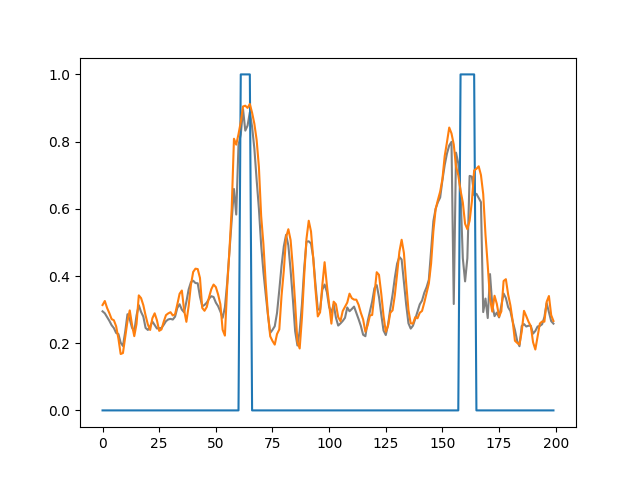

In [ ]:
####figure out how bennet sampled everything.. 
import numpy as np
from scipy.ndimage import gaussian_filter1d
import copy

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors



exp_date_to_midlines = {}
exp_date_to_body_angles = {}
exp_date_to_rslds_states = {}
exp_date_to_speed = {}
exp_date_to_velocity = {}
exp_date_to_head_angle  = {}
exp_date_to_acceleration  = {}
exp_date_to_worm_curvature = {}
exp_date_to_head_curvature = {}
exp_date_to_worm_vel = {}
exp_date_to_masks = {}
target_length = 80
time_bin = 1

json_dir = "/Users/friederikebuck/Desktop/MBL/project/data/Neuropal_no_heat/"
h5_dir ="/Users/friederikebuck/Desktop/MBL/project/data/processed_h5/"
beh_data_dir_parent = "/Users/friederikebuck/Desktop/MBL/project/outputs/"
        
        
# with open(f'/Users/friederikebuck/Desktop/MBL/project/beh_syllables_rslds_{model_name}_all_exps.pickle', 'rb') as handle: ##off by 10..figureo ut in which directio n
#     a = pickle.load(handle)

#     exp_dates, exp_date_to_syllables, date_to_discrete_rslds_states, exp_date_to_beh,syllables, \
#     syllables_all_dates, rslds_states_all_dates, syllables_all_dates_flat, \
#     rslds_states_all_dates_flat, beh_all_dates_flat, beh_all_dates = a
    

directories = glob.glob(json_dir+"*.json") #get filename/paths of all the json files
exp_dates = [directory.split("/")[-1].split(".")[0] for directory in directories] #extract the exp_dates
print("exp_dates", exp_dates)
# for e in exp_dates: 
#     print(exp_date_to_beh[e].shape)

def load_from_csv(filename, n_frames = None, n_pts = None, n_dim = 2):
    # Load the CSV file
    reshaped_array = np.loadtxt(filename, delimiter=",")
    if n_frames is None: 
        n_frames = reshaped_array.shape[0]
    if n_pts is None: 
        n_pts = int(reshaped_array.shape[1]/2)
    # Reshape back to the original shape (n_frames, n_pts, 2)
    original_shape_array = reshaped_array.reshape(n_frames, n_pts, n_dim)
    
    return original_shape_array


for i, exp_date in enumerate(exp_dates): 
    n_frames =1599
    # n_frames = -1
        
        
    midline_dir  = f"/Users/friederikebuck/Desktop/MBL/project/outputs/{exp_date}/csvs1"
    # midline_txt = os.path.join(midline_dir,f"midlines_resampled_target_length_110_timebin_{time_bin}.csv" )
    midline_txt = os.path.join(midline_dir,f"cropped_midlines_wormtracer_target_length_{target_length}_timebin_{time_bin}.csv" )
    midlines = load_from_csv(midline_txt)[:n_frames, :, :]
    ###need to resamplet o confocal timeframe 
    masks_txt = os.path.join(midline_dir,f"mask_resampled_target_length_{target_length}_timebin_{time_bin}.csv" )
    masks = np.loadtxt(masks_txt, delimiter=",")[:n_frames]
    
    exp_date_to_midlines[exp_date] = midlines
    exp_date_to_masks[exp_date] = masks
    exp_date_to_body_angle_mag[exp_date] , exp_date_to_body_angles[exp_date] = get_body_angle_mag_from_midline(midlines)
    
    # exp_date_to_rslds_states[exp_date] = rslds_states_all_dates[:,  i ]
    
    speed_txt = os.path.join(midline_dir,f"nir_speed_stage_resampled_timebin_{time_bin}.csv" )
    # speed_resampled = load_from_csv(speed_txt)[:n_frames]#, :, :]
    speed_resampled =np.loadtxt(speed_txt, delimiter=",")[:n_frames]
    exp_date_to_speed[exp_date] = speed_resampled
    
    velocity_txt = os.path.join(midline_dir,f"nir_velocity_stage_resampled_timebin_{time_bin}.csv" )
    # speed_resampled = load_from_csv(speed_txt)[:n_frames]#, :, :]
    velocity_resampled = np.loadtxt(velocity_txt, delimiter=",")[:n_frames]
    # velocity_resampled = 
    exp_date_to_velocity[exp_date] = velocity_resampled
    
    exp_date_to_acceleration[exp_date] = get_acceleration(np.loadtxt(velocity_txt, delimiter=",")[:n_frames+10], 10, sigma = 2 )[1]
    



    exp_date_to_velocity[exp_date] = velocity_resampled
    
    head_angle_txt = os.path.join(midline_dir,f"nir_head_angle_resampled_timebin_{time_bin}.csv" )
    # head_angle_resampled = load_from_csv(head_angle_txt)[:n_frames]#, :, :]
    head_angle_resampled =np.loadtxt(head_angle_txt, delimiter=",")[:n_frames]
    exp_date_to_head_angle[exp_date] = head_angle_resampled
    
    dt, T, beh_data, neural_data, neuroID_to_key = get_exp_features(exp_date, 
                                                                json_dir = json_dir, 
                                                                h5_dir = h5_dir)
    behavior_features = get_behavior_features(beh_data)
    beh_data.update(behavior_features)
    exp_date_to_worm_curvature[exp_date] = beh_data["worm_curvature"]
    exp_date_to_head_curvature[exp_date] = beh_data["head_angle"]
    exp_date_to_worm_vel[exp_date] = beh_data["worm_curvature"]
    
    # velocity = np.array([full_beh_data[i]["velocity"][0:1599] for i in range(len(full_beh_data))])
    # acceleration = np.array([full_beh_data[i]["acceleration"][1:1600] for i in range(len(full_beh_data))])
    # head_curvature = np.array([full_beh_data[i]["head_angle"][0:1599] for i in range(len(full_beh_data))])
    # worm_curvature = np.array([full_beh_data[i]["worm_curvature"][0:1599] for i in range(len(full_beh_data))])
    # pumping = np.array([full_beh_data[i]["pumping"][0:1599] for i in range(len(full_beh_data))])

exp_date = exp_dates[-4]
# for exp_date in exp_dates:
fig, ax = plt.subplots()
time = np.arange(200,400)
ax.plot((exp_date_to_worm_curvature[exp_date]/np.nanmax(exp_date_to_worm_curvature[exp_date]))[time], c = "gray")
ax.plot((exp_date_to_masks[exp_date]/np.nanmax(exp_date_to_masks[exp_date]))[time])
ax.plot((exp_date_to_body_angle_mag[exp_date]/np.nanmax(exp_date_to_body_angle_mag[exp_date]))[time])
    # ax.plot(velocity_resampled[300:600])
    # ax.plot(np.abs(velocity_resampled[300:600]))
    # ax2.plot( exp_date_to_acceleration[exp_date][300:600])

In [ ]:
# exp_date_to_body_angles

{'2022-06-14-01': array([[-0.45296565, -0.45980175, -0.44932301, ..., -1.13896381,
         -1.23220487, -1.31263283],
        [ 0.16035349,  0.15373363,  0.17945658, ..., -1.37645001,
         -1.38004541, -1.37267564],
        [ 0.9441634 ,  0.96248433,  0.98915448, ..., -1.27738819,
         -1.25142   , -1.2164887 ],
        ...,
        [ 0.08546297,  0.09415154,  0.11617695, ..., -1.07428928,
         -1.0552425 , -1.02017533],
        [-0.32631829, -0.35085666, -0.34972106, ..., -1.05664785,
         -1.06051686, -1.04898484],
        [-0.35490401, -0.36204091, -0.36903192, ..., -1.04823744,
         -1.07931884, -1.09599115]]),
 '2023-01-23-08': array([[-0.17253094, -0.16989397, -0.17095296, ...,  0.46598996,
          0.40867402,  0.35211949],
        [-0.12466834, -0.1232392 , -0.11967499, ...,  0.66587501,
          0.6230912 ,  0.56865532],
        [-0.19963098, -0.21264319, -0.20940317, ...,  0.76764902,
          0.77954517,  0.78085658],
        ...,
        [ 0.06062583